# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 3s 0us/step


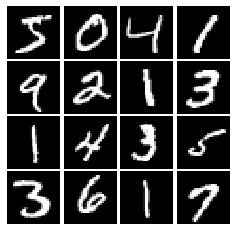

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(
        [batch_size, dim], minval=-1, maxval=1, dtype=tf.dtypes.float32
    )

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Input(shape=(784,)),
        tf.keras.layers.Dense(256, activation = leaky_relu),
        tf.keras.layers.Dense(256, activation = leaky_relu),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [12]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Input(shape=(noise_dim,)),
        tf.keras.layers.Dense(1024, activation = "relu"),
        tf.keras.layers.Dense(1024, activation = "relu"),
        tf.keras.layers.Dense(784, activation = "tanh"),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [13]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [57]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_image_loss = bce(tf.ones_like(logits_real), logits_real)
    fake_image_loss = bce(tf.zeros_like(logits_fake), logits_fake)
    loss = tf.reduce_sum(real_image_loss + fake_image_loss)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    true_labels = tf.ones_like(logits_fake)
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(true_labels,logits_fake)
    loss = tf.reduce_sum(loss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [58]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [59]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [50]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [51]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.358, G:0.7499


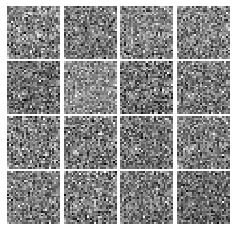

Epoch: 0, Iter: 20, D: 0.5776, G:0.9994


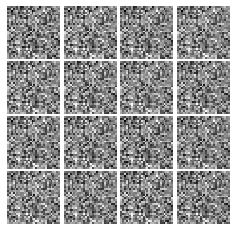

Epoch: 0, Iter: 40, D: 0.5896, G:1.105


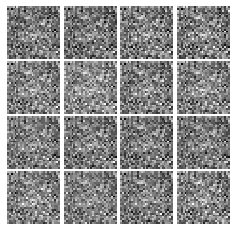

Epoch: 0, Iter: 60, D: 5.383, G:0.1217


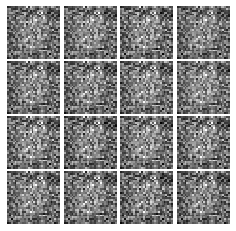

Epoch: 0, Iter: 80, D: 1.244, G:1.231


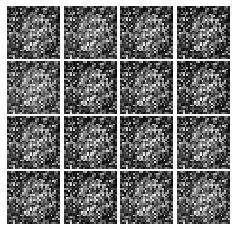

Epoch: 0, Iter: 100, D: 1.754, G:0.4349


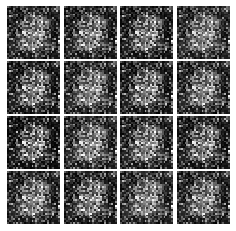

Epoch: 0, Iter: 120, D: 0.9602, G:1.329


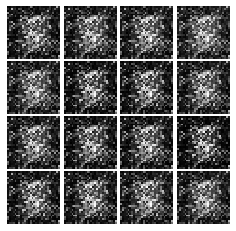

Epoch: 0, Iter: 140, D: 1.363, G:1.934


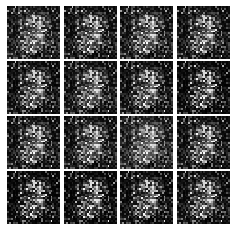

Epoch: 0, Iter: 160, D: 0.6739, G:2.003


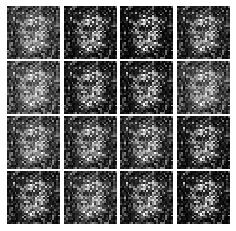

Epoch: 0, Iter: 180, D: 1.714, G:1.255


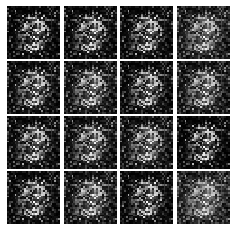

Epoch: 0, Iter: 200, D: 1.571, G:2.126


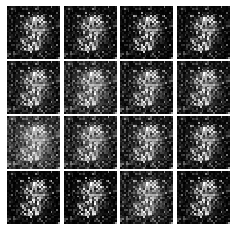

Epoch: 0, Iter: 220, D: 1.445, G:1.032


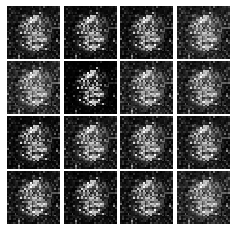

Epoch: 0, Iter: 240, D: 1.834, G:0.3946


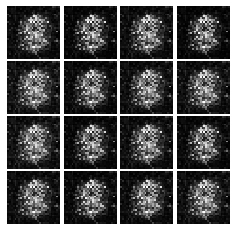

Epoch: 0, Iter: 260, D: 0.9161, G:1.163


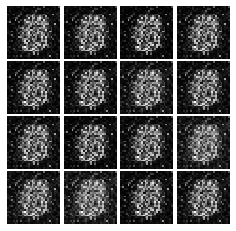

Epoch: 0, Iter: 280, D: 1.193, G:1.397


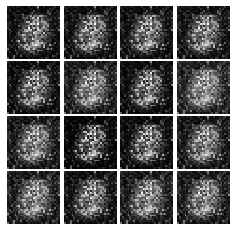

Epoch: 0, Iter: 300, D: 1.189, G:1.783


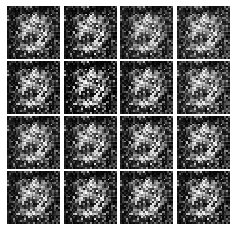

Epoch: 0, Iter: 320, D: 1.2, G:1.282


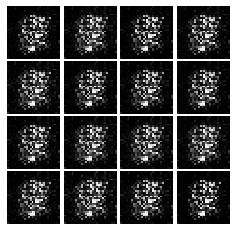

Epoch: 0, Iter: 340, D: 1.184, G:1.612


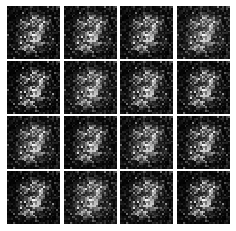

Epoch: 0, Iter: 360, D: 0.9234, G:1.64


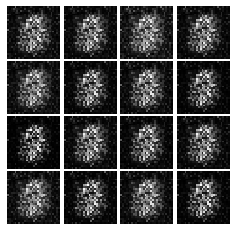

Epoch: 0, Iter: 380, D: 0.9447, G:1.25


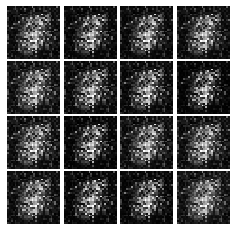

Epoch: 0, Iter: 400, D: 1.434, G:2.0


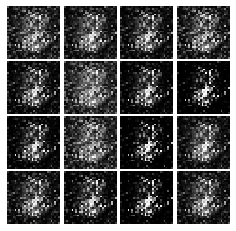

Epoch: 0, Iter: 420, D: 1.184, G:1.031


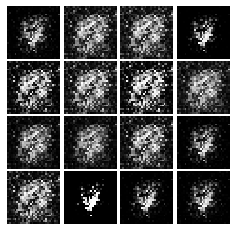

Epoch: 0, Iter: 440, D: 1.167, G:1.52


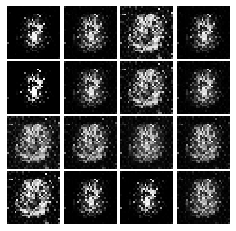

Epoch: 0, Iter: 460, D: 1.089, G:1.295


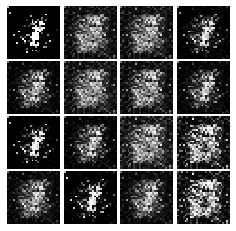

Epoch: 1, Iter: 480, D: 0.9364, G:1.287


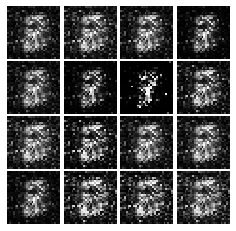

Epoch: 1, Iter: 500, D: 1.252, G:2.471


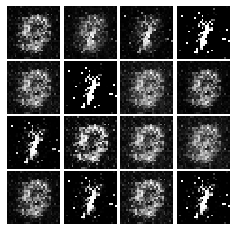

Epoch: 1, Iter: 520, D: 0.759, G:1.625


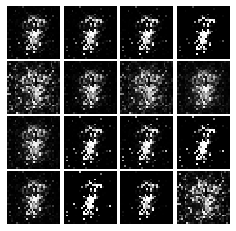

Epoch: 1, Iter: 540, D: 1.174, G:0.9647


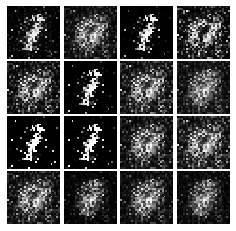

Epoch: 1, Iter: 560, D: 0.8064, G:1.583


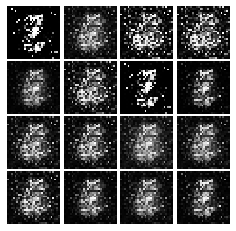

Epoch: 1, Iter: 580, D: 1.699, G:1.224


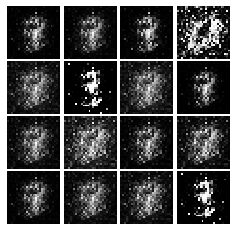

Epoch: 1, Iter: 600, D: 1.01, G:2.211


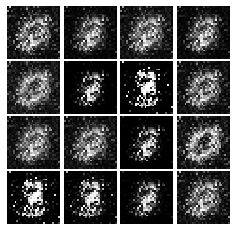

Epoch: 1, Iter: 620, D: 1.07, G:2.527


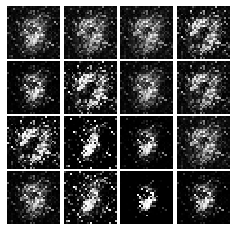

Epoch: 1, Iter: 640, D: 0.9919, G:1.457


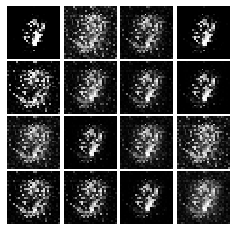

Epoch: 1, Iter: 660, D: 1.038, G:1.616


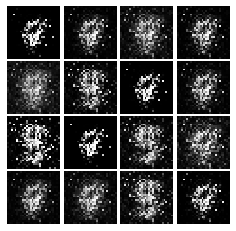

Epoch: 1, Iter: 680, D: 1.199, G:1.466


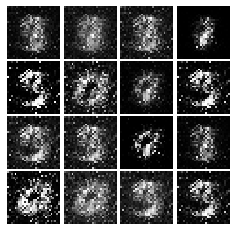

Epoch: 1, Iter: 700, D: 0.9857, G:1.274


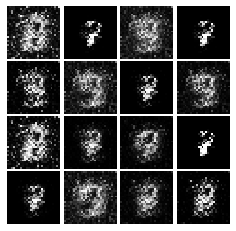

Epoch: 1, Iter: 720, D: 0.9847, G:1.735


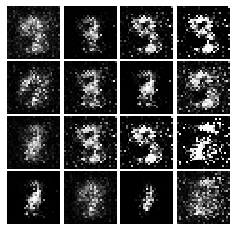

Epoch: 1, Iter: 740, D: 1.125, G:3.593


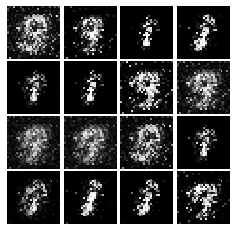

Epoch: 1, Iter: 760, D: 1.071, G:1.271


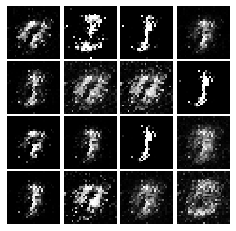

Epoch: 1, Iter: 780, D: 1.43, G:1.739


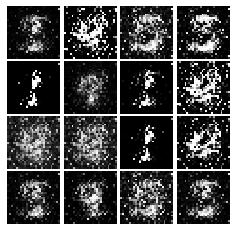

Epoch: 1, Iter: 800, D: 1.126, G:1.034


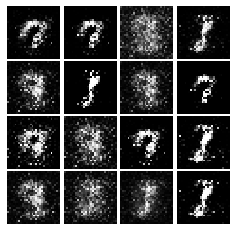

Epoch: 1, Iter: 820, D: 1.158, G:3.347


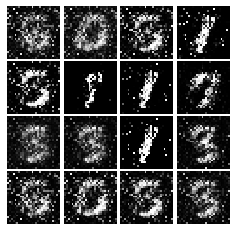

Epoch: 1, Iter: 840, D: 1.222, G:1.08


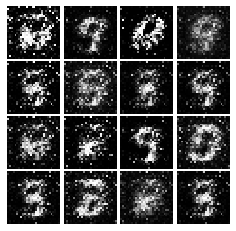

Epoch: 1, Iter: 860, D: 1.127, G:1.026


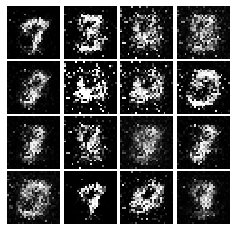

Epoch: 1, Iter: 880, D: 1.302, G:4.228


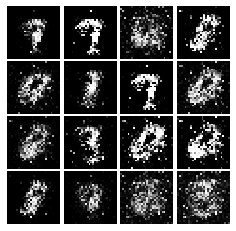

Epoch: 1, Iter: 900, D: 1.186, G:1.006


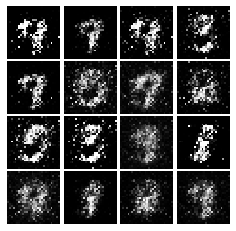

Epoch: 1, Iter: 920, D: 1.874, G:0.4382


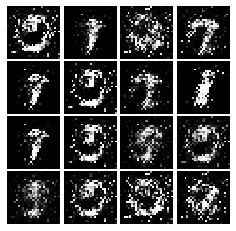

Epoch: 2, Iter: 940, D: 1.362, G:1.023


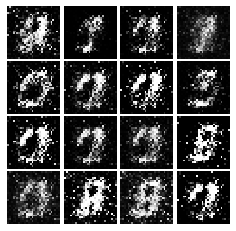

Epoch: 2, Iter: 960, D: 1.136, G:1.825


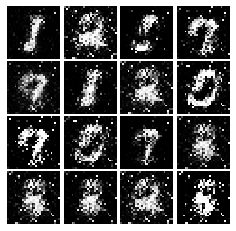

Epoch: 2, Iter: 980, D: 1.006, G:1.524


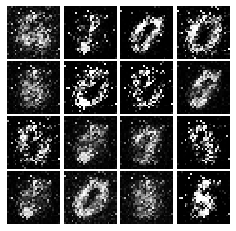

Epoch: 2, Iter: 1000, D: 1.248, G:1.066


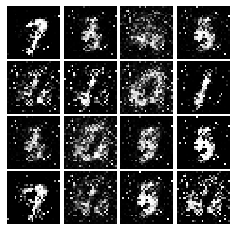

Epoch: 2, Iter: 1020, D: 1.315, G:1.759


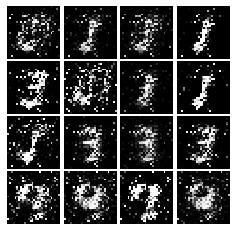

Epoch: 2, Iter: 1040, D: 5.227, G:0.8774


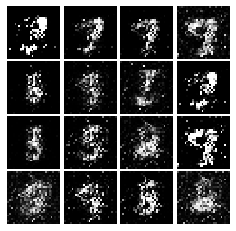

Epoch: 2, Iter: 1060, D: 1.269, G:0.9414


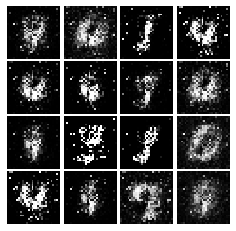

Epoch: 2, Iter: 1080, D: 1.14, G:1.177


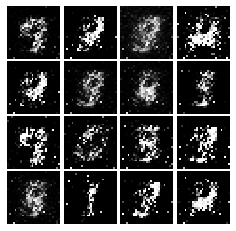

Epoch: 2, Iter: 1100, D: 1.267, G:0.8933


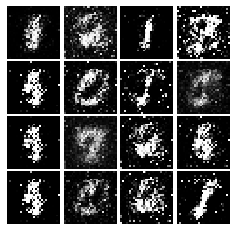

Epoch: 2, Iter: 1120, D: 1.369, G:0.8525


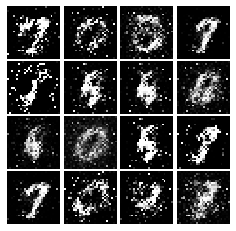

Epoch: 2, Iter: 1140, D: 1.233, G:1.239


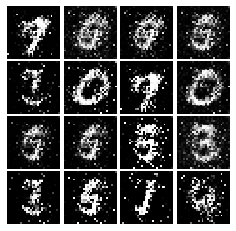

Epoch: 2, Iter: 1160, D: 1.165, G:0.9525


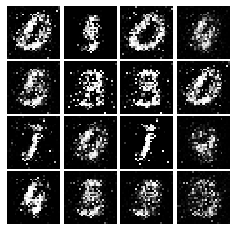

Epoch: 2, Iter: 1180, D: 1.326, G:1.159


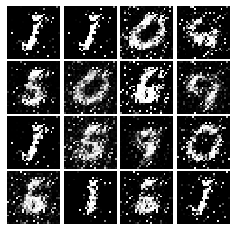

Epoch: 2, Iter: 1200, D: 1.315, G:0.9346


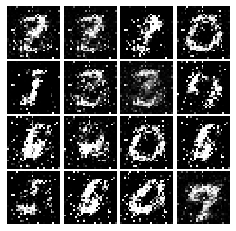

Epoch: 2, Iter: 1220, D: 1.385, G:1.184


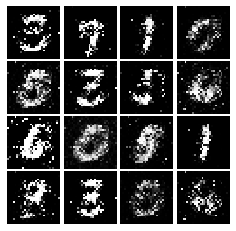

Epoch: 2, Iter: 1240, D: 1.265, G:1.246


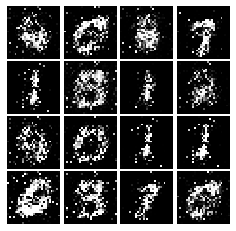

Epoch: 2, Iter: 1260, D: 2.111, G:1.931


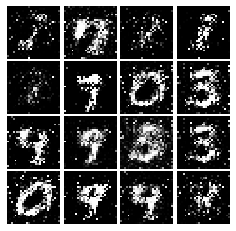

Epoch: 2, Iter: 1280, D: 1.339, G:1.009


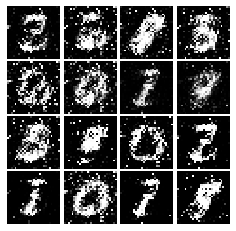

Epoch: 2, Iter: 1300, D: 1.172, G:0.9101


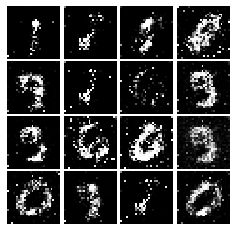

Epoch: 2, Iter: 1320, D: 1.516, G:0.8588


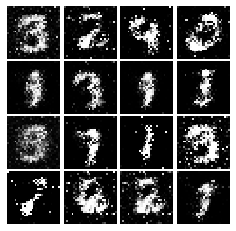

Epoch: 2, Iter: 1340, D: 2.599, G:0.9258


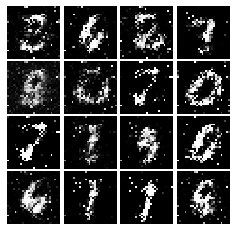

Epoch: 2, Iter: 1360, D: 1.292, G:1.081


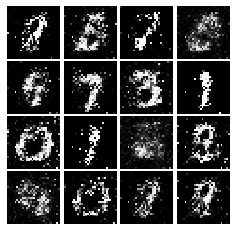

Epoch: 2, Iter: 1380, D: 1.235, G:1.049


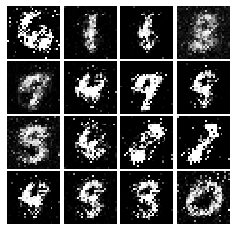

Epoch: 2, Iter: 1400, D: 1.13, G:0.9748


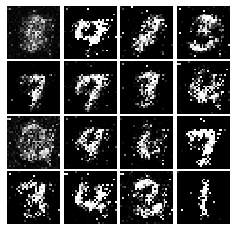

Epoch: 3, Iter: 1420, D: 1.414, G:0.8124


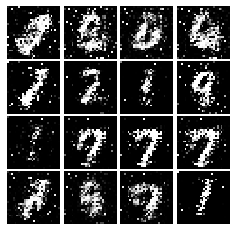

Epoch: 3, Iter: 1440, D: 0.9523, G:1.224


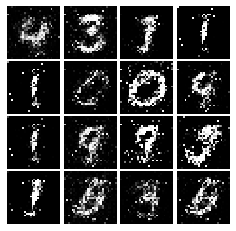

Epoch: 3, Iter: 1460, D: 1.237, G:1.008


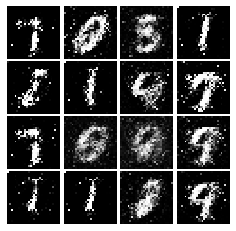

Epoch: 3, Iter: 1480, D: 1.248, G:0.9655


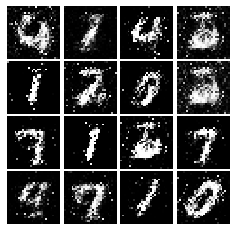

Epoch: 3, Iter: 1500, D: 1.173, G:1.491


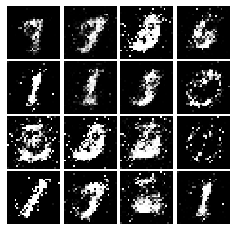

Epoch: 3, Iter: 1520, D: 1.358, G:0.9383


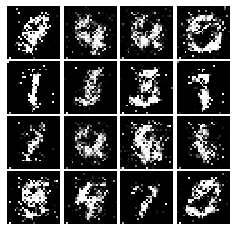

Epoch: 3, Iter: 1540, D: 1.072, G:1.069


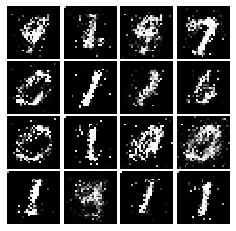

Epoch: 3, Iter: 1560, D: 1.218, G:1.277


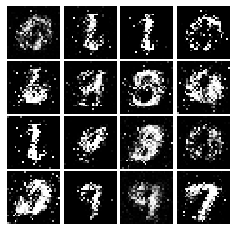

Epoch: 3, Iter: 1580, D: 1.163, G:1.596


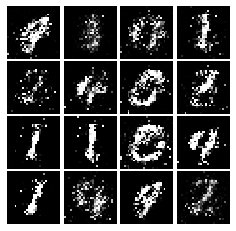

Epoch: 3, Iter: 1600, D: 1.38, G:0.9706


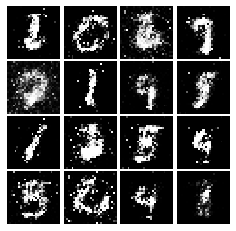

Epoch: 3, Iter: 1620, D: 1.179, G:0.9759


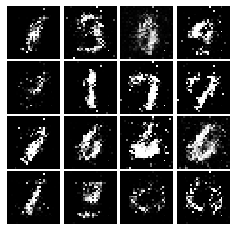

Epoch: 3, Iter: 1640, D: 1.271, G:0.8891


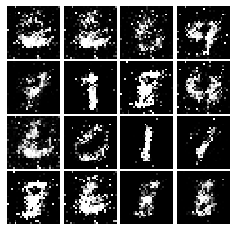

Epoch: 3, Iter: 1660, D: 1.235, G:0.9093


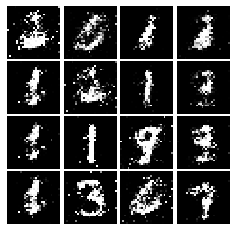

Epoch: 3, Iter: 1680, D: 1.225, G:0.9854


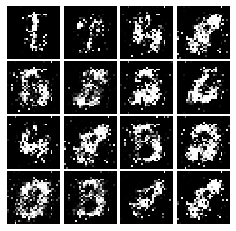

Epoch: 3, Iter: 1700, D: 1.255, G:1.254


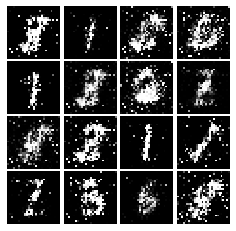

Epoch: 3, Iter: 1720, D: 1.199, G:0.9072


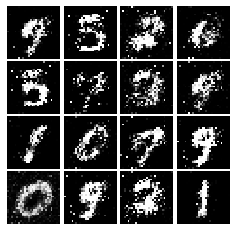

Epoch: 3, Iter: 1740, D: 1.204, G:1.059


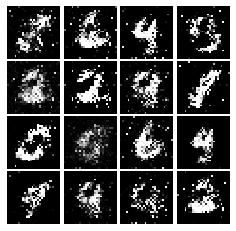

Epoch: 3, Iter: 1760, D: 1.182, G:1.095


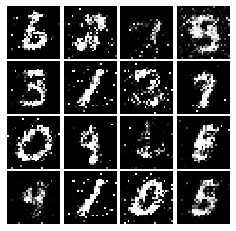

Epoch: 3, Iter: 1780, D: 1.327, G:0.7933


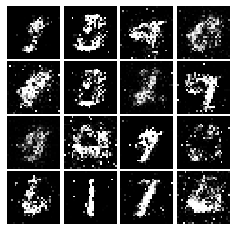

Epoch: 3, Iter: 1800, D: 1.312, G:1.18


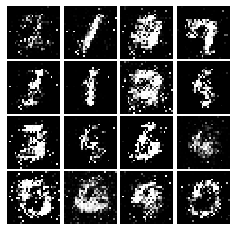

Epoch: 3, Iter: 1820, D: 1.244, G:1.278


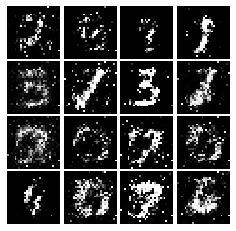

Epoch: 3, Iter: 1840, D: 1.317, G:0.8146


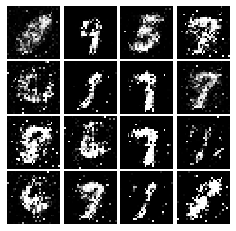

Epoch: 3, Iter: 1860, D: 1.321, G:0.8006


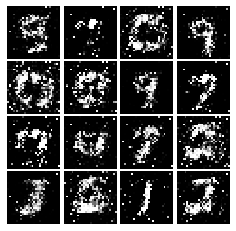

Epoch: 4, Iter: 1880, D: 1.337, G:0.9312


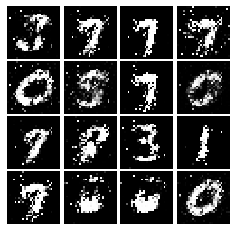

Epoch: 4, Iter: 1900, D: 1.366, G:0.8623


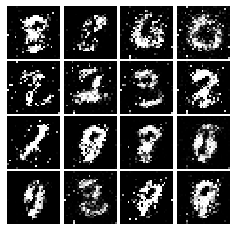

Epoch: 4, Iter: 1920, D: 1.253, G:0.9276


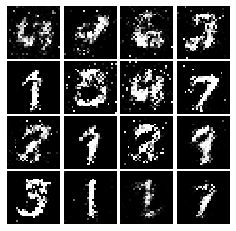

Epoch: 4, Iter: 1940, D: 1.117, G:0.8293


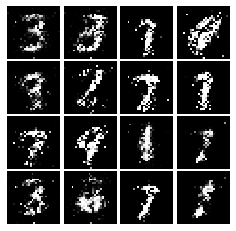

Epoch: 4, Iter: 1960, D: 1.28, G:0.9979


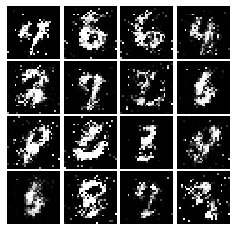

Epoch: 4, Iter: 1980, D: 1.436, G:0.7868


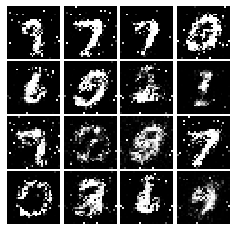

Epoch: 4, Iter: 2000, D: 1.449, G:0.9484


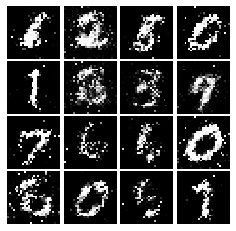

Epoch: 4, Iter: 2020, D: 1.351, G:0.8841


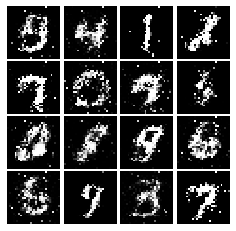

Epoch: 4, Iter: 2040, D: 1.292, G:1.048


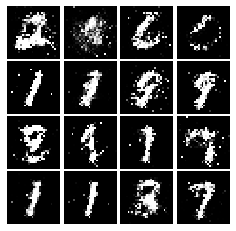

Epoch: 4, Iter: 2060, D: 1.411, G:0.7585


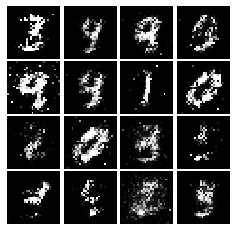

Epoch: 4, Iter: 2080, D: 1.231, G:0.8904


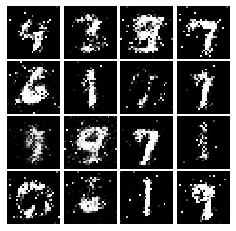

Epoch: 4, Iter: 2100, D: 1.274, G:0.9271


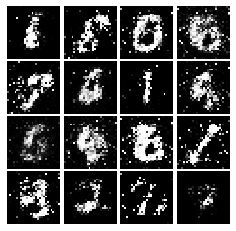

Epoch: 4, Iter: 2120, D: 1.292, G:0.7628


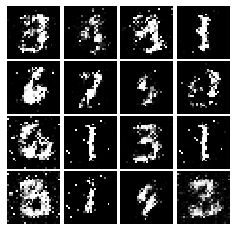

Epoch: 4, Iter: 2140, D: 1.265, G:0.7745


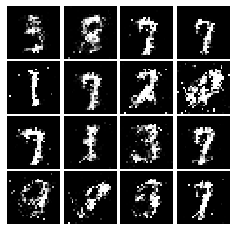

Epoch: 4, Iter: 2160, D: 1.357, G:0.5884


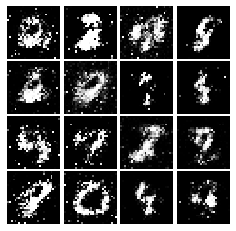

Epoch: 4, Iter: 2180, D: 1.299, G:0.8193


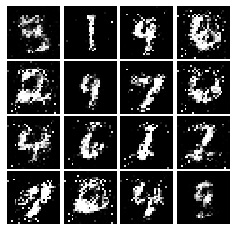

Epoch: 4, Iter: 2200, D: 1.206, G:0.8922


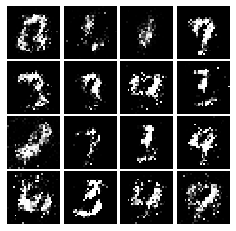

Epoch: 4, Iter: 2220, D: 1.226, G:0.8743


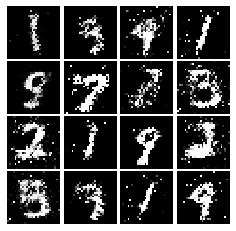

Epoch: 4, Iter: 2240, D: 1.309, G:0.8638


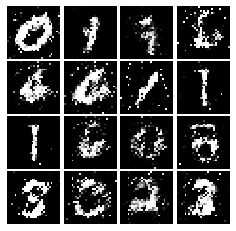

Epoch: 4, Iter: 2260, D: 1.407, G:0.8381


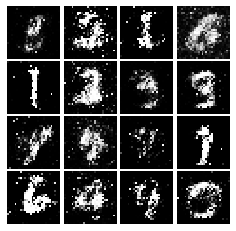

Epoch: 4, Iter: 2280, D: 1.279, G:0.8324


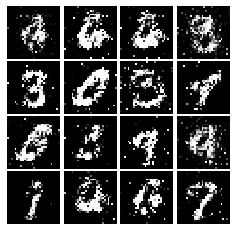

Epoch: 4, Iter: 2300, D: 1.287, G:0.8255


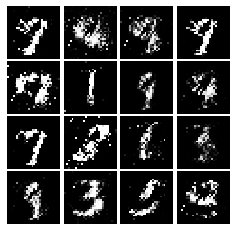

Epoch: 4, Iter: 2320, D: 1.331, G:1.22


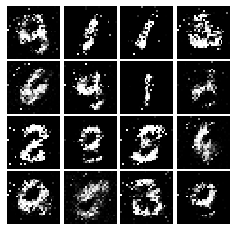

Epoch: 4, Iter: 2340, D: 1.281, G:0.7892


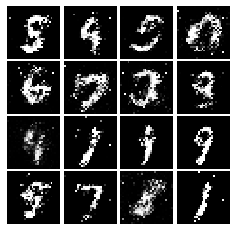

Epoch: 5, Iter: 2360, D: 1.223, G:0.909


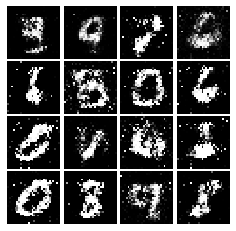

Epoch: 5, Iter: 2380, D: 1.199, G:0.901


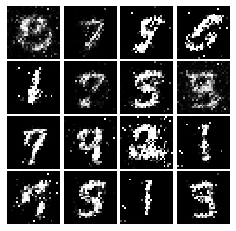

Epoch: 5, Iter: 2400, D: 1.232, G:1.005


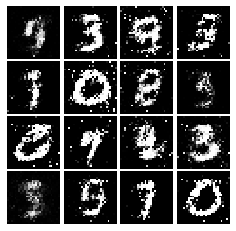

Epoch: 5, Iter: 2420, D: 1.241, G:0.9559


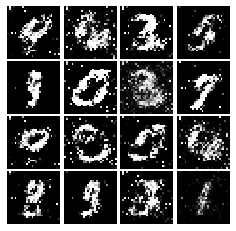

Epoch: 5, Iter: 2440, D: 1.293, G:0.8912


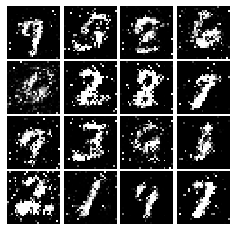

Epoch: 5, Iter: 2460, D: 1.282, G:1.037


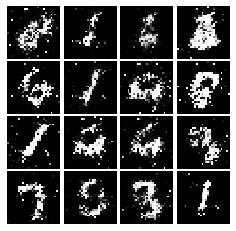

Epoch: 5, Iter: 2480, D: 1.322, G:0.9241


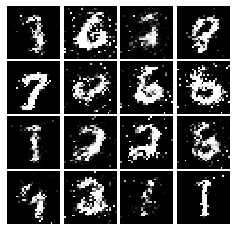

Epoch: 5, Iter: 2500, D: 1.309, G:0.8826


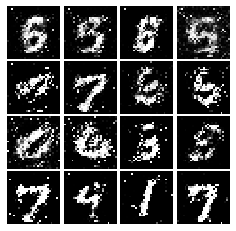

Epoch: 5, Iter: 2520, D: 1.293, G:0.7702


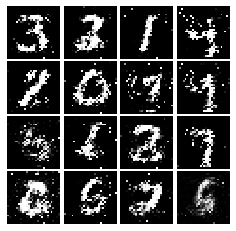

Epoch: 5, Iter: 2540, D: 1.327, G:0.9346


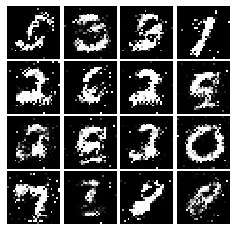

Epoch: 5, Iter: 2560, D: 1.35, G:0.8735


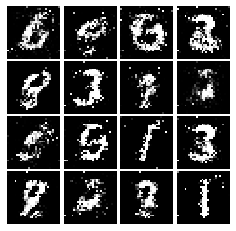

Epoch: 5, Iter: 2580, D: 1.285, G:0.8377


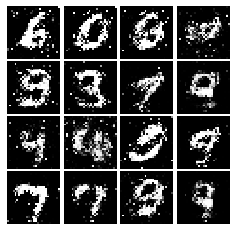

Epoch: 5, Iter: 2600, D: 1.398, G:0.8132


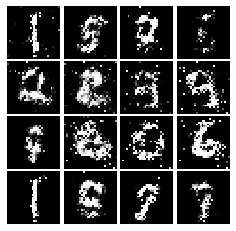

Epoch: 5, Iter: 2620, D: 1.334, G:0.9473


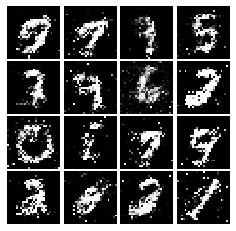

Epoch: 5, Iter: 2640, D: 1.282, G:0.916


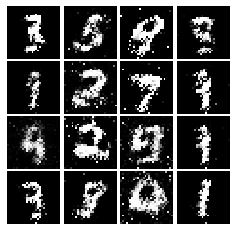

Epoch: 5, Iter: 2660, D: 1.279, G:0.8481


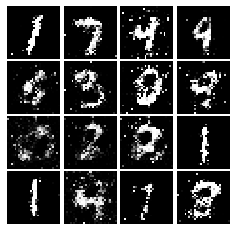

Epoch: 5, Iter: 2680, D: 1.367, G:0.8331


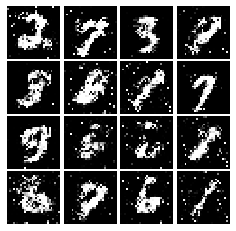

Epoch: 5, Iter: 2700, D: 1.304, G:0.8388


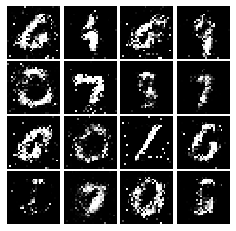

Epoch: 5, Iter: 2720, D: 1.223, G:0.8714


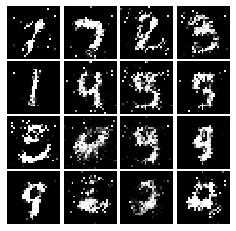

Epoch: 5, Iter: 2740, D: 1.389, G:0.8103


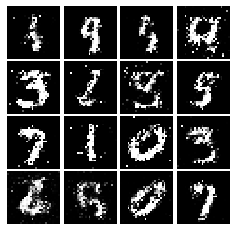

Epoch: 5, Iter: 2760, D: 1.504, G:1.216


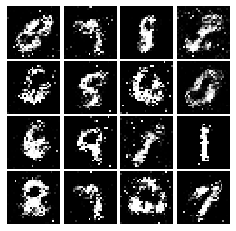

Epoch: 5, Iter: 2780, D: 1.248, G:0.8532


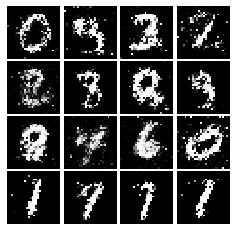

Epoch: 5, Iter: 2800, D: 1.35, G:0.7878


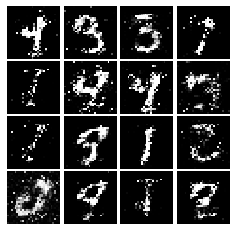

Epoch: 6, Iter: 2820, D: 1.322, G:0.7527


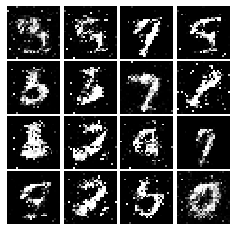

Epoch: 6, Iter: 2840, D: 1.287, G:0.9091


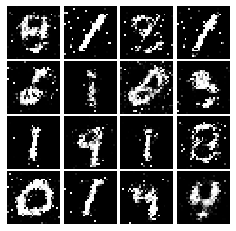

Epoch: 6, Iter: 2860, D: 1.343, G:0.8387


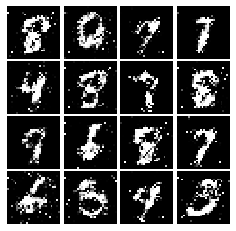

Epoch: 6, Iter: 2880, D: 1.233, G:0.8551


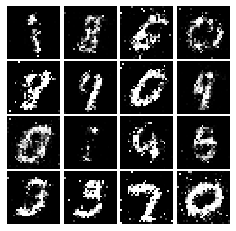

Epoch: 6, Iter: 2900, D: 1.337, G:0.8661


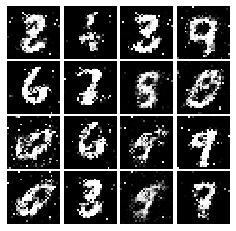

Epoch: 6, Iter: 2920, D: 1.373, G:0.9323


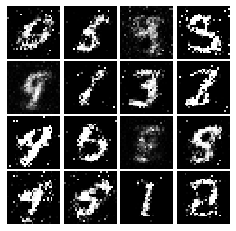

Epoch: 6, Iter: 2940, D: 1.273, G:0.8169


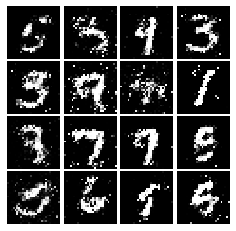

Epoch: 6, Iter: 2960, D: 1.316, G:0.8154


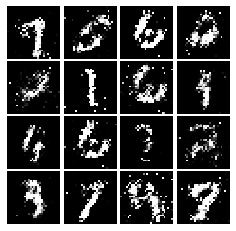

Epoch: 6, Iter: 2980, D: 1.336, G:0.7985


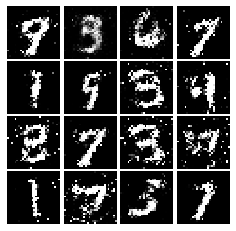

Epoch: 6, Iter: 3000, D: 1.294, G:0.9564


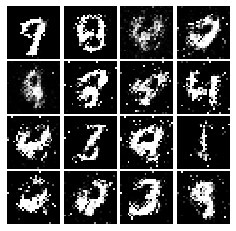

Epoch: 6, Iter: 3020, D: 1.375, G:0.7916


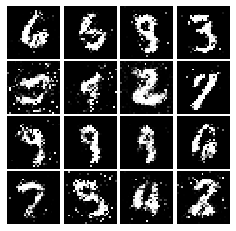

Epoch: 6, Iter: 3040, D: 1.273, G:0.8944


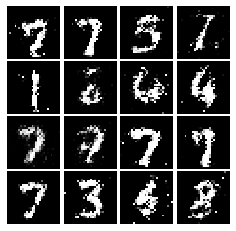

Epoch: 6, Iter: 3060, D: 1.254, G:0.8568


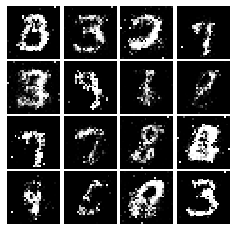

Epoch: 6, Iter: 3080, D: 1.322, G:0.8412


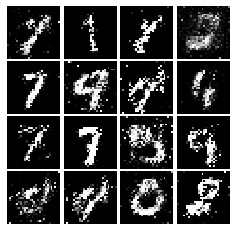

Epoch: 6, Iter: 3100, D: 1.167, G:0.9088


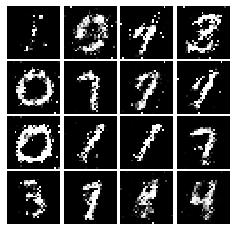

Epoch: 6, Iter: 3120, D: 1.435, G:0.7217


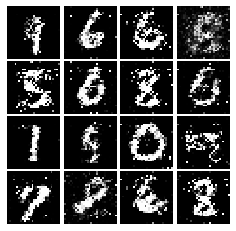

Epoch: 6, Iter: 3140, D: 1.364, G:0.9897


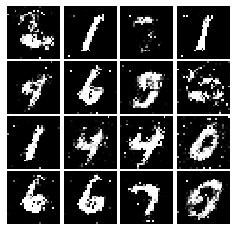

Epoch: 6, Iter: 3160, D: 1.326, G:0.8387


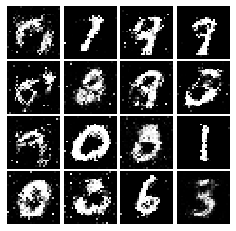

Epoch: 6, Iter: 3180, D: 1.264, G:0.7852


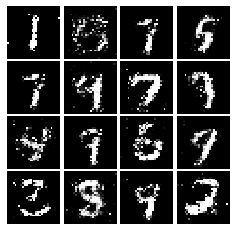

Epoch: 6, Iter: 3200, D: 1.392, G:0.8057


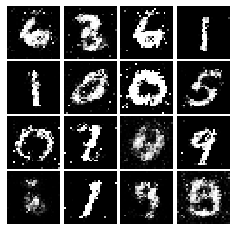

Epoch: 6, Iter: 3220, D: 1.306, G:0.8471


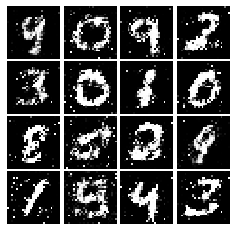

Epoch: 6, Iter: 3240, D: 1.35, G:0.7454


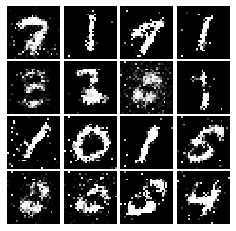

Epoch: 6, Iter: 3260, D: 1.348, G:0.7408


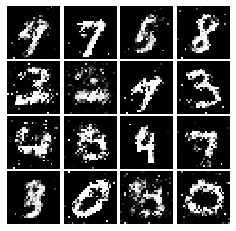

Epoch: 6, Iter: 3280, D: 1.29, G:0.8068


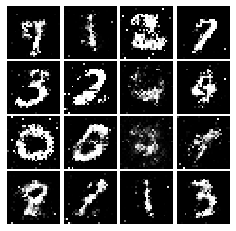

Epoch: 7, Iter: 3300, D: 1.302, G:0.9981


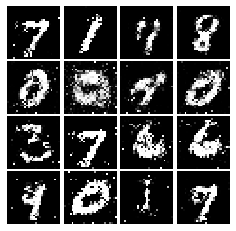

Epoch: 7, Iter: 3320, D: 1.307, G:0.8645


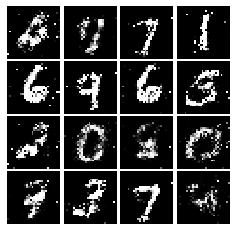

Epoch: 7, Iter: 3340, D: 1.254, G:0.9007


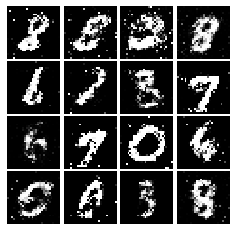

Epoch: 7, Iter: 3360, D: 1.498, G:0.8127


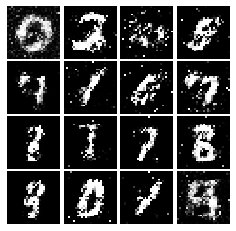

Epoch: 7, Iter: 3380, D: 1.413, G:0.7465


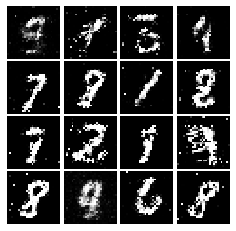

Epoch: 7, Iter: 3400, D: 1.371, G:0.7749


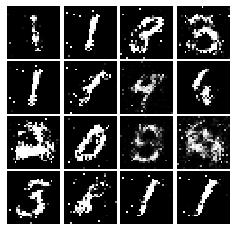

Epoch: 7, Iter: 3420, D: 1.273, G:0.8582


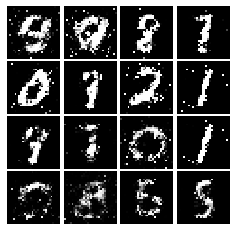

Epoch: 7, Iter: 3440, D: 1.38, G:0.9282


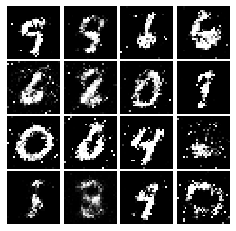

Epoch: 7, Iter: 3460, D: 1.224, G:0.8795


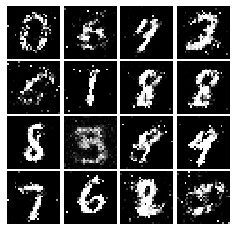

Epoch: 7, Iter: 3480, D: 1.297, G:0.7954


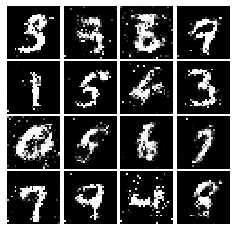

Epoch: 7, Iter: 3500, D: 1.399, G:0.8819


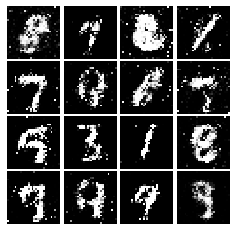

Epoch: 7, Iter: 3520, D: 1.331, G:0.8449


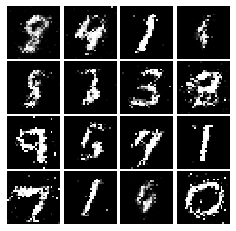

Epoch: 7, Iter: 3540, D: 1.213, G:0.8143


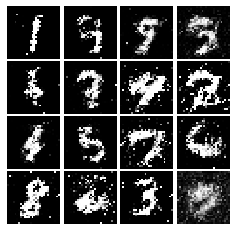

Epoch: 7, Iter: 3560, D: 1.246, G:0.8844


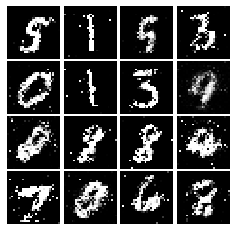

Epoch: 7, Iter: 3580, D: 1.293, G:0.9077


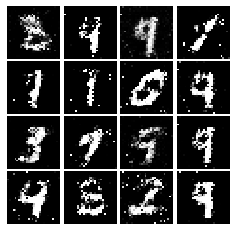

Epoch: 7, Iter: 3600, D: 1.362, G:0.9276


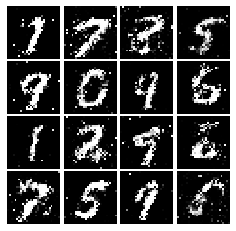

Epoch: 7, Iter: 3620, D: 1.287, G:0.8808


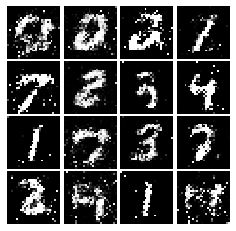

Epoch: 7, Iter: 3640, D: 1.279, G:0.9287


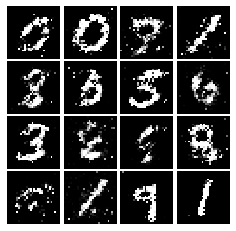

Epoch: 7, Iter: 3660, D: 1.169, G:0.928


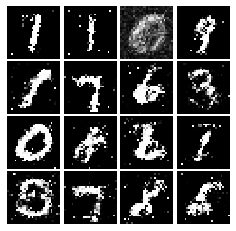

Epoch: 7, Iter: 3680, D: 1.212, G:0.9546


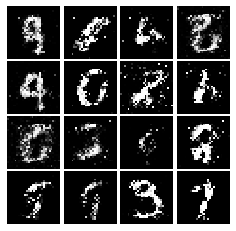

Epoch: 7, Iter: 3700, D: 1.344, G:0.8172


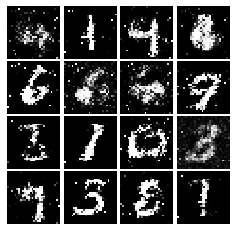

Epoch: 7, Iter: 3720, D: 1.307, G:0.8205


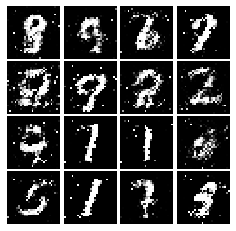

Epoch: 7, Iter: 3740, D: 1.404, G:0.8335


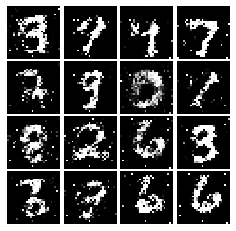

Epoch: 8, Iter: 3760, D: 1.378, G:0.4897


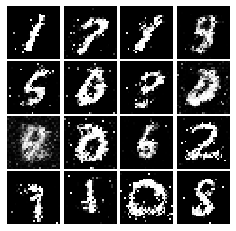

Epoch: 8, Iter: 3780, D: 1.428, G:1.019


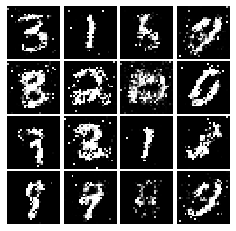

Epoch: 8, Iter: 3800, D: 1.295, G:0.8229


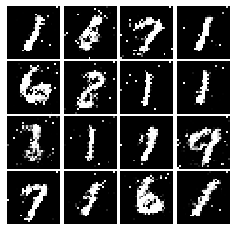

Epoch: 8, Iter: 3820, D: 1.412, G:0.7637


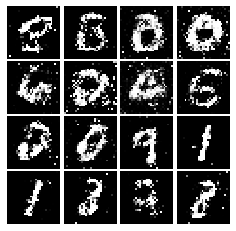

Epoch: 8, Iter: 3840, D: 1.307, G:0.7709


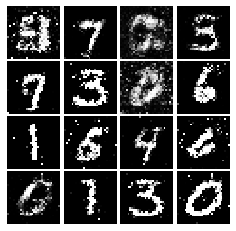

Epoch: 8, Iter: 3860, D: 1.335, G:0.8227


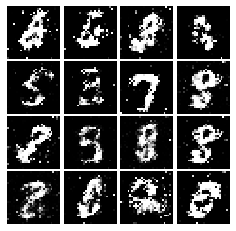

Epoch: 8, Iter: 3880, D: 1.31, G:0.7674


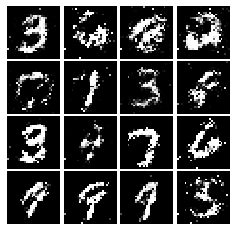

Epoch: 8, Iter: 3900, D: 1.34, G:0.7799


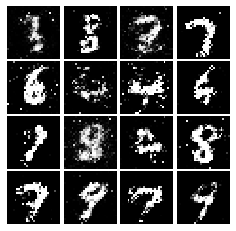

Epoch: 8, Iter: 3920, D: 1.341, G:0.7706


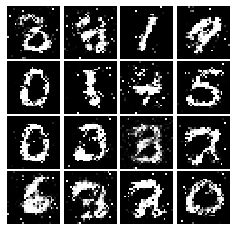

Epoch: 8, Iter: 3940, D: 1.376, G:0.8517


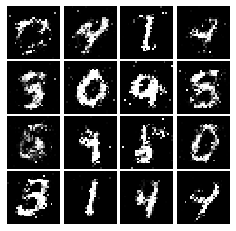

Epoch: 8, Iter: 3960, D: 1.3, G:0.8454


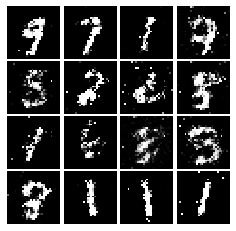

Epoch: 8, Iter: 3980, D: 1.367, G:0.7584


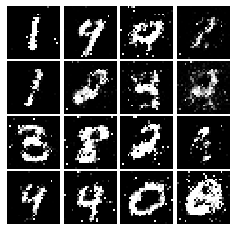

Epoch: 8, Iter: 4000, D: 1.311, G:0.7925


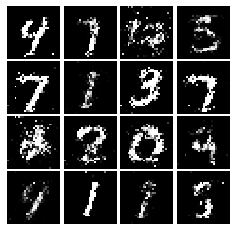

Epoch: 8, Iter: 4020, D: 1.331, G:0.7126


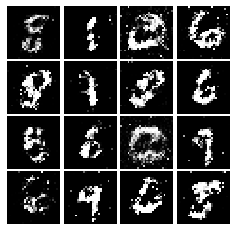

Epoch: 8, Iter: 4040, D: 1.333, G:0.7454


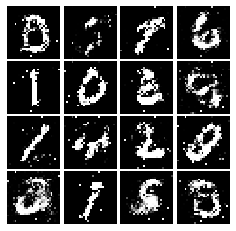

Epoch: 8, Iter: 4060, D: 1.331, G:0.7407


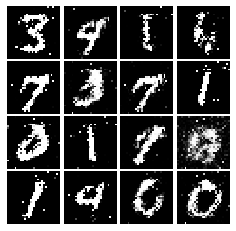

Epoch: 8, Iter: 4080, D: 1.315, G:0.9066


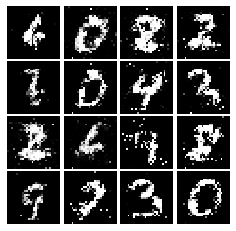

Epoch: 8, Iter: 4100, D: 1.335, G:0.7876


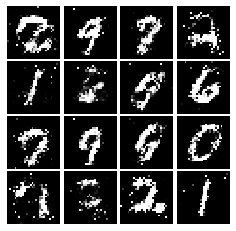

Epoch: 8, Iter: 4120, D: 1.33, G:0.7756


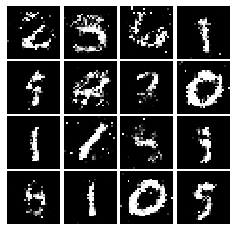

Epoch: 8, Iter: 4140, D: 1.291, G:0.7912


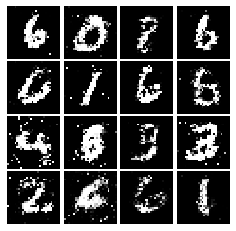

Epoch: 8, Iter: 4160, D: 1.388, G:1.069


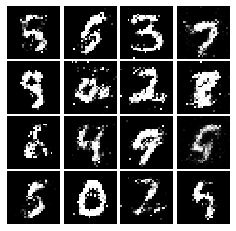

Epoch: 8, Iter: 4180, D: 1.342, G:0.8561


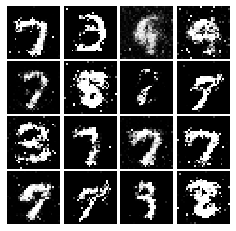

Epoch: 8, Iter: 4200, D: 1.296, G:0.842


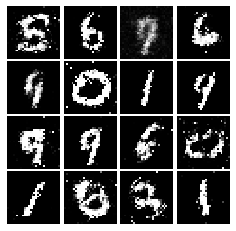

Epoch: 8, Iter: 4220, D: 1.375, G:0.8023


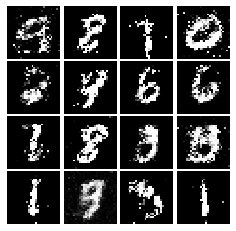

Epoch: 9, Iter: 4240, D: 1.378, G:0.8419


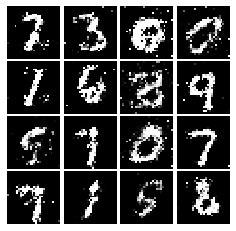

Epoch: 9, Iter: 4260, D: 1.348, G:0.7495


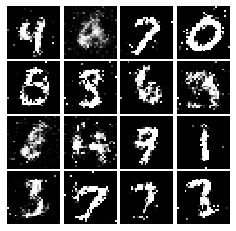

Epoch: 9, Iter: 4280, D: 1.372, G:0.7564


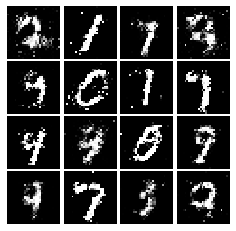

Epoch: 9, Iter: 4300, D: 1.314, G:0.8604


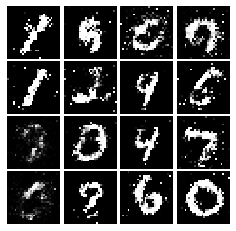

Epoch: 9, Iter: 4320, D: 1.399, G:0.756


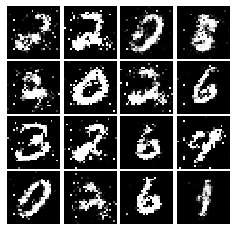

Epoch: 9, Iter: 4340, D: 1.326, G:0.8093


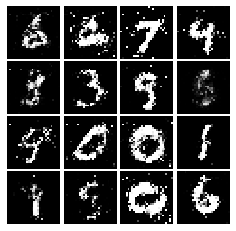

Epoch: 9, Iter: 4360, D: 1.342, G:0.7866


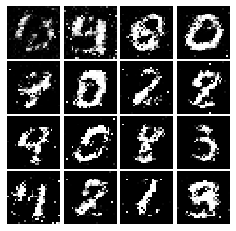

Epoch: 9, Iter: 4380, D: 1.32, G:0.7867


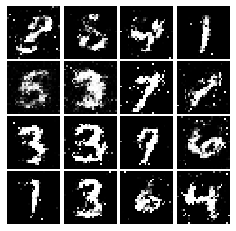

Epoch: 9, Iter: 4400, D: 1.344, G:0.8907


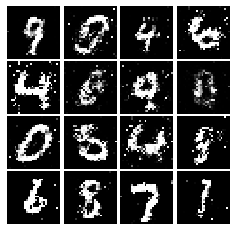

Epoch: 9, Iter: 4420, D: 1.306, G:0.7661


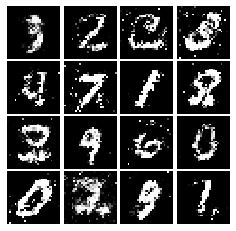

Epoch: 9, Iter: 4440, D: 1.355, G:0.7395


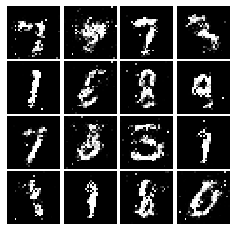

Epoch: 9, Iter: 4460, D: 1.355, G:0.8261


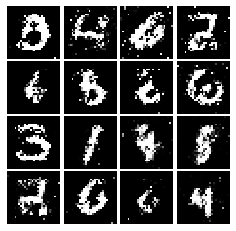

Epoch: 9, Iter: 4480, D: 1.319, G:0.7495


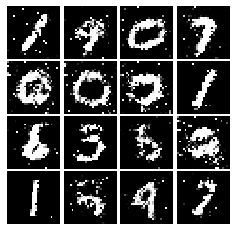

Epoch: 9, Iter: 4500, D: 1.477, G:0.7305


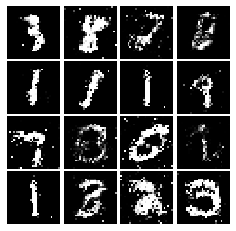

Epoch: 9, Iter: 4520, D: 1.323, G:0.8008


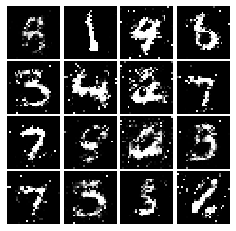

Epoch: 9, Iter: 4540, D: 1.298, G:0.8488


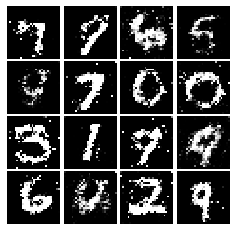

Epoch: 9, Iter: 4560, D: 1.326, G:0.8296


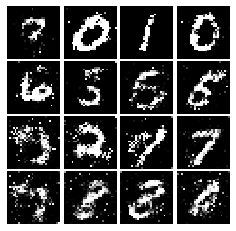

Epoch: 9, Iter: 4580, D: 1.329, G:0.7248


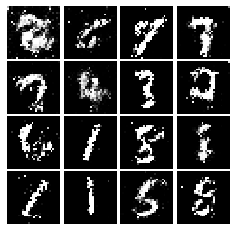

Epoch: 9, Iter: 4600, D: 1.378, G:0.7523


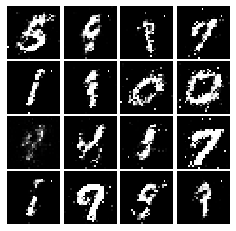

Epoch: 9, Iter: 4620, D: 1.386, G:0.7591


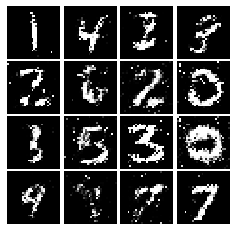

Epoch: 9, Iter: 4640, D: 1.356, G:0.7604


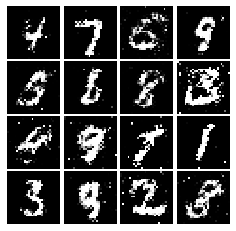

Epoch: 9, Iter: 4660, D: 1.378, G:0.7858


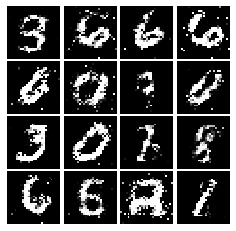

Epoch: 9, Iter: 4680, D: 1.39, G:0.8097


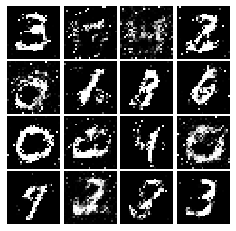

Final images


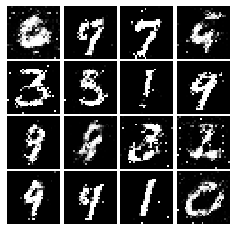

In [53]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [60]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_real - tf.ones_like(scores_real)) ** 2) + \
          0.5 * tf.reduce_mean(scores_fake ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - tf.ones_like(scores_fake)) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [61]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.708, G:0.4294


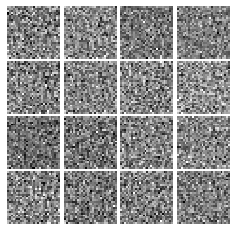

Epoch: 0, Iter: 20, D: 0.08382, G:1.146


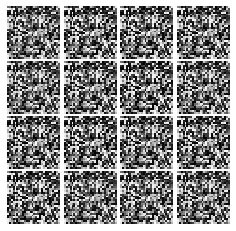

Epoch: 0, Iter: 40, D: 0.01264, G:0.555


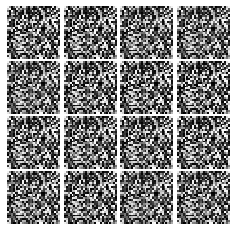

Epoch: 0, Iter: 60, D: 0.09676, G:1.197


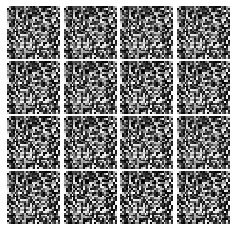

Epoch: 0, Iter: 80, D: 0.06155, G:0.6893


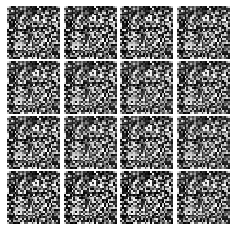

Epoch: 0, Iter: 100, D: 0.04587, G:1.005


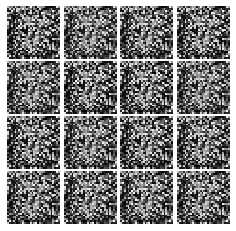

Epoch: 0, Iter: 120, D: 0.005581, G:0.5211


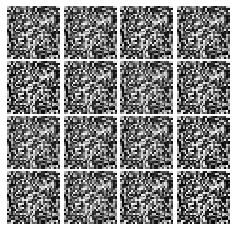

Epoch: 0, Iter: 140, D: 0.006397, G:0.6188


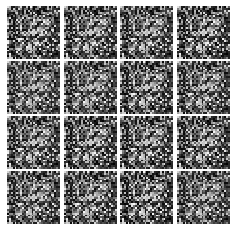

Epoch: 0, Iter: 160, D: 0.05952, G:0.9969


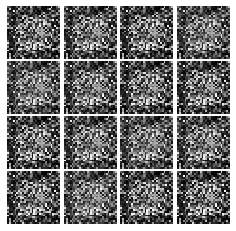

Epoch: 0, Iter: 180, D: 0.4057, G:1.245


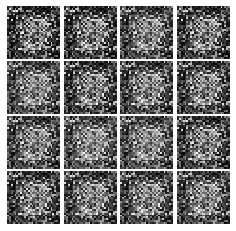

Epoch: 0, Iter: 200, D: 1.041, G:1.246


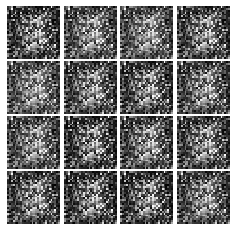

Epoch: 0, Iter: 220, D: 0.1442, G:0.2842


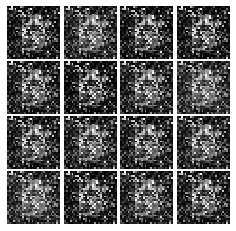

Epoch: 0, Iter: 240, D: 0.1182, G:0.1926


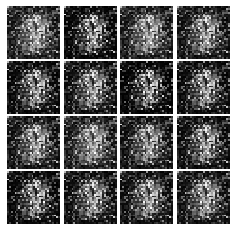

Epoch: 0, Iter: 260, D: 0.1256, G:0.522


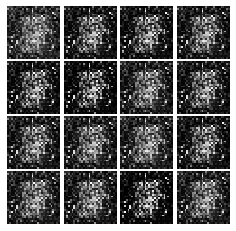

Epoch: 0, Iter: 280, D: 0.2566, G:0.2446


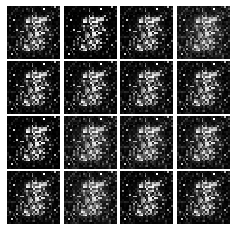

Epoch: 0, Iter: 300, D: 0.2047, G:0.1952


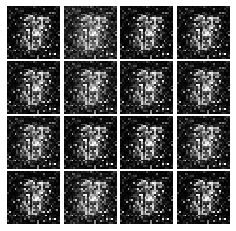

Epoch: 0, Iter: 320, D: 0.1946, G:0.216


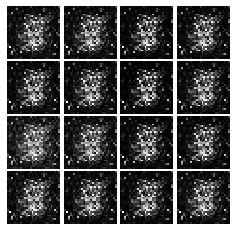

Epoch: 0, Iter: 340, D: 0.1206, G:0.3964


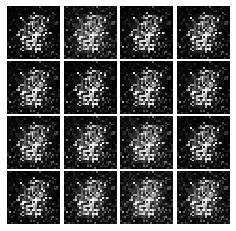

Epoch: 0, Iter: 360, D: 0.409, G:0.9158


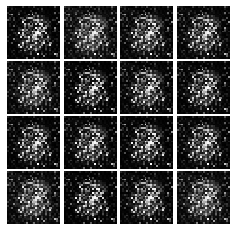

Epoch: 0, Iter: 380, D: 0.1575, G:0.5776


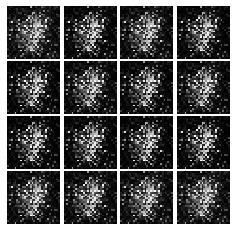

Epoch: 0, Iter: 400, D: 0.114, G:0.2986


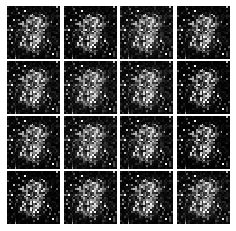

Epoch: 0, Iter: 420, D: 0.1611, G:0.8102


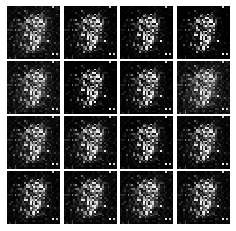

Epoch: 0, Iter: 440, D: 0.1633, G:0.5252


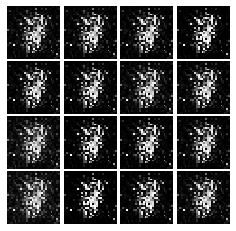

Epoch: 0, Iter: 460, D: 0.1284, G:0.884


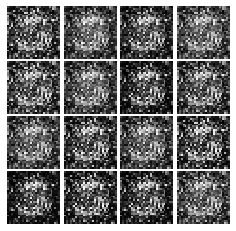

Epoch: 1, Iter: 480, D: 0.1045, G:0.4892


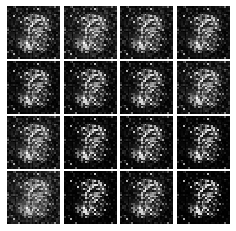

Epoch: 1, Iter: 500, D: 0.1261, G:0.5229


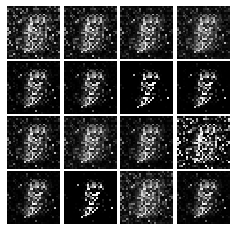

Epoch: 1, Iter: 520, D: 0.09591, G:0.3776


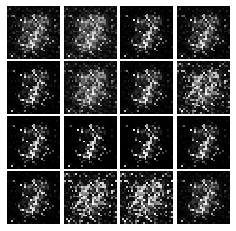

Epoch: 1, Iter: 540, D: 0.0898, G:0.4568


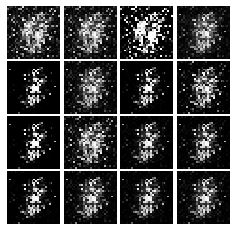

Epoch: 1, Iter: 560, D: 0.1366, G:0.315


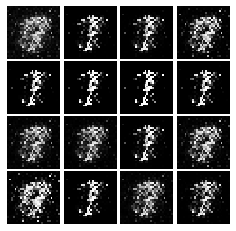

Epoch: 1, Iter: 580, D: 0.1442, G:0.5291


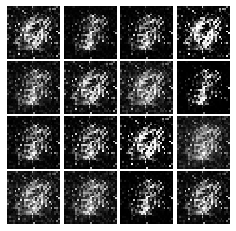

Epoch: 1, Iter: 600, D: 0.08533, G:0.4125


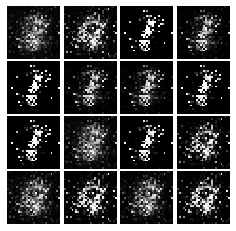

Epoch: 1, Iter: 620, D: 0.1382, G:0.337


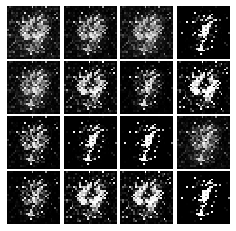

Epoch: 1, Iter: 640, D: 0.09311, G:0.4056


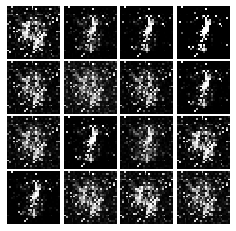

Epoch: 1, Iter: 660, D: 0.17, G:0.3526


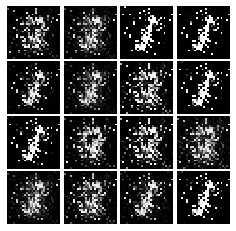

Epoch: 1, Iter: 680, D: 0.1192, G:0.3792


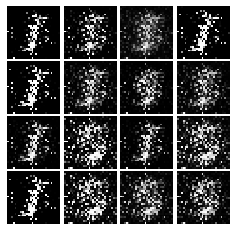

Epoch: 1, Iter: 700, D: 0.1405, G:0.2625


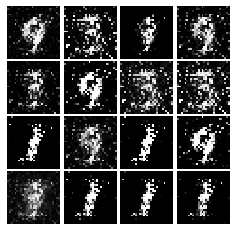

Epoch: 1, Iter: 720, D: 0.1494, G:0.5489


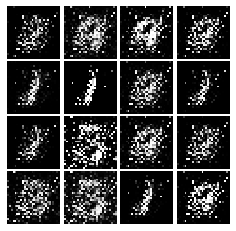

Epoch: 1, Iter: 740, D: 0.1082, G:0.54


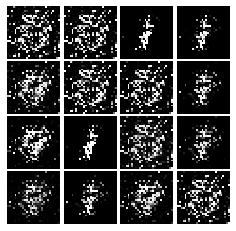

Epoch: 1, Iter: 760, D: 0.1064, G:0.1006


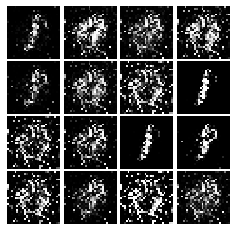

Epoch: 1, Iter: 780, D: 0.1201, G:0.3794


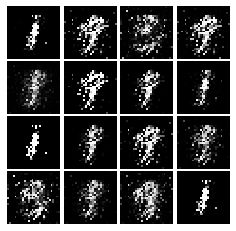

Epoch: 1, Iter: 800, D: 0.2333, G:0.2456


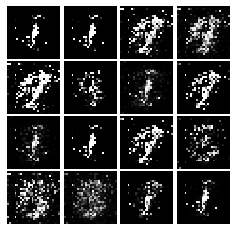

Epoch: 1, Iter: 820, D: 0.08632, G:0.4736


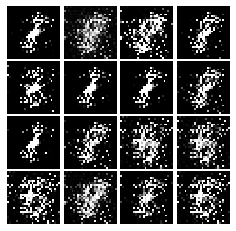

Epoch: 1, Iter: 840, D: 0.07132, G:0.4058


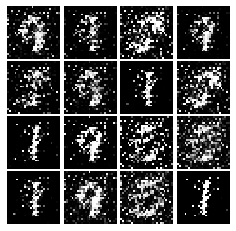

Epoch: 1, Iter: 860, D: 0.1068, G:0.5447


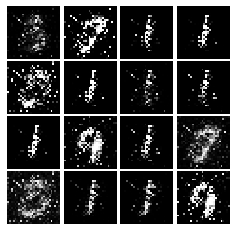

Epoch: 1, Iter: 880, D: 0.2523, G:0.1988


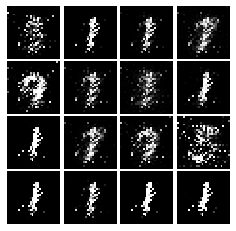

Epoch: 1, Iter: 900, D: 0.1193, G:0.3385


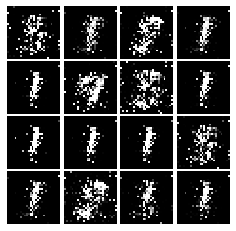

Epoch: 1, Iter: 920, D: 0.1331, G:0.4108


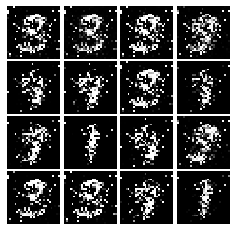

Epoch: 2, Iter: 940, D: 0.1069, G:0.7353


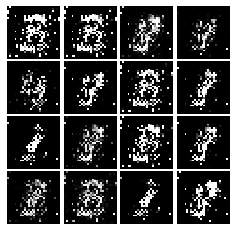

Epoch: 2, Iter: 960, D: 0.1014, G:0.3856


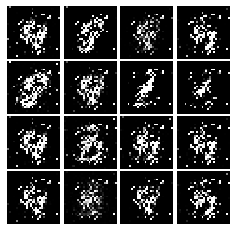

Epoch: 2, Iter: 980, D: 0.08938, G:0.4429


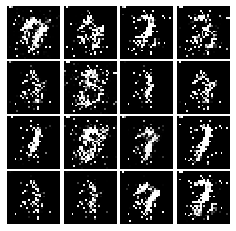

Epoch: 2, Iter: 1000, D: 0.1456, G:0.3883


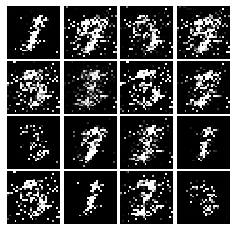

Epoch: 2, Iter: 1020, D: 0.1056, G:0.3543


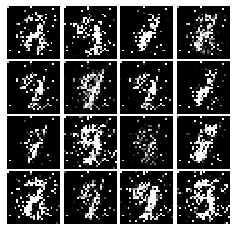

Epoch: 2, Iter: 1040, D: 0.2626, G:0.3331


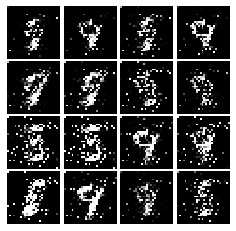

Epoch: 2, Iter: 1060, D: 0.1329, G:0.3605


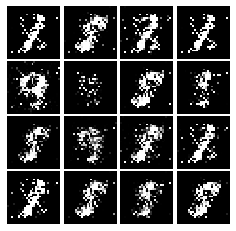

Epoch: 2, Iter: 1080, D: 0.1355, G:0.347


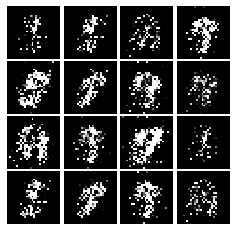

Epoch: 2, Iter: 1100, D: 0.122, G:0.2889


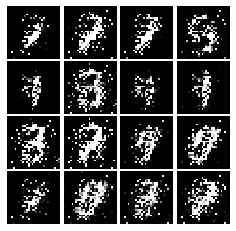

Epoch: 2, Iter: 1120, D: 0.1384, G:0.5177


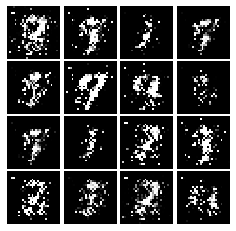

Epoch: 2, Iter: 1140, D: 0.1117, G:0.2938


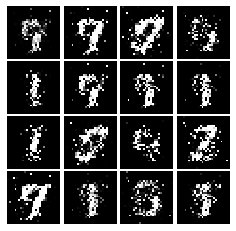

Epoch: 2, Iter: 1160, D: 0.08795, G:0.3546


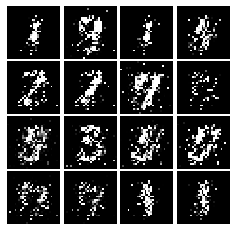

Epoch: 2, Iter: 1180, D: 0.1323, G:0.3992


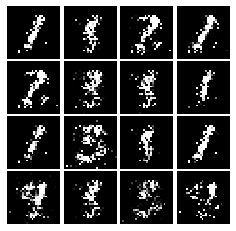

Epoch: 2, Iter: 1200, D: 0.1009, G:0.51


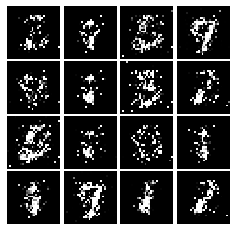

Epoch: 2, Iter: 1220, D: 0.1052, G:0.7611


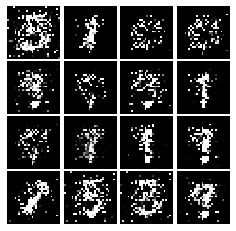

Epoch: 2, Iter: 1240, D: 0.08423, G:0.389


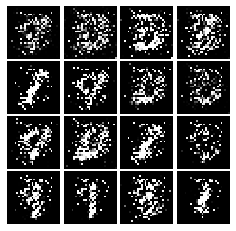

Epoch: 2, Iter: 1260, D: 0.1429, G:0.3563


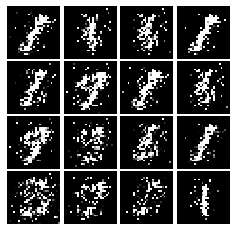

Epoch: 2, Iter: 1280, D: 0.1309, G:0.234


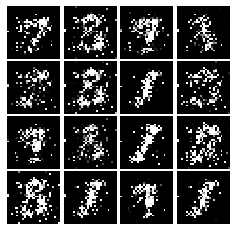

Epoch: 2, Iter: 1300, D: 0.3385, G:0.03943


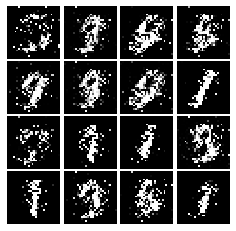

Epoch: 2, Iter: 1320, D: 0.1401, G:0.6799


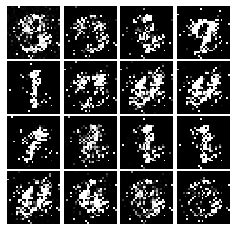

Epoch: 2, Iter: 1340, D: 0.1101, G:0.3017


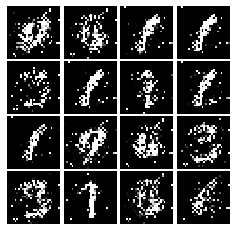

Epoch: 2, Iter: 1360, D: 0.13, G:0.2916


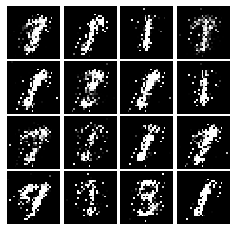

Epoch: 2, Iter: 1380, D: 0.1182, G:0.3015


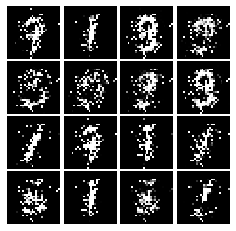

Epoch: 2, Iter: 1400, D: 0.1288, G:1.0


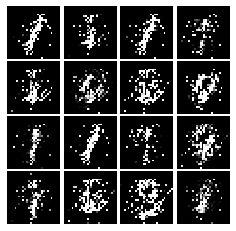

Epoch: 3, Iter: 1420, D: 0.1464, G:0.2778


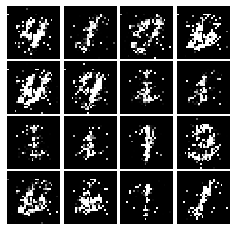

Epoch: 3, Iter: 1440, D: 0.1091, G:0.4322


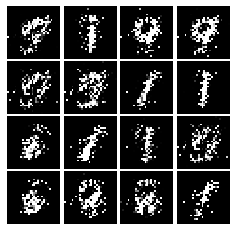

Epoch: 3, Iter: 1460, D: 0.1998, G:0.262


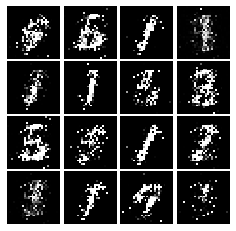

Epoch: 3, Iter: 1480, D: 0.1415, G:0.3313


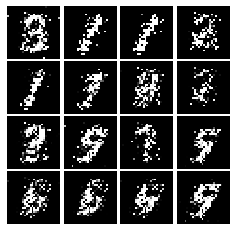

Epoch: 3, Iter: 1500, D: 0.1529, G:0.7038


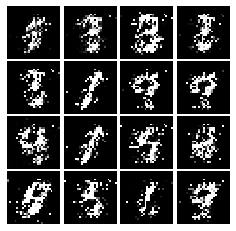

Epoch: 3, Iter: 1520, D: 0.1796, G:0.2367


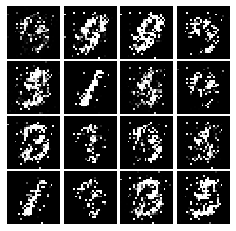

Epoch: 3, Iter: 1540, D: 0.17, G:0.2963


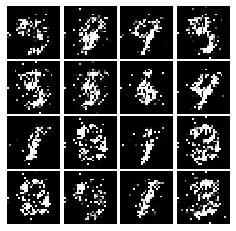

Epoch: 3, Iter: 1560, D: 0.1252, G:0.2998


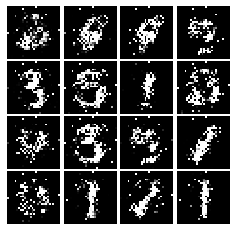

Epoch: 3, Iter: 1580, D: 0.139, G:0.3419


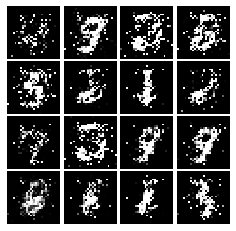

Epoch: 3, Iter: 1600, D: 0.1439, G:0.3449


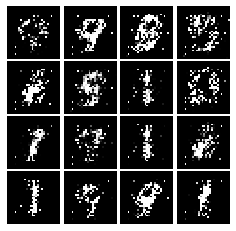

Epoch: 3, Iter: 1620, D: 0.1372, G:0.4398


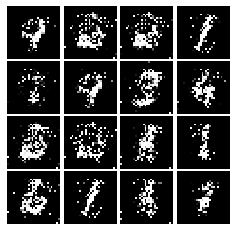

Epoch: 3, Iter: 1640, D: 0.1625, G:0.7396


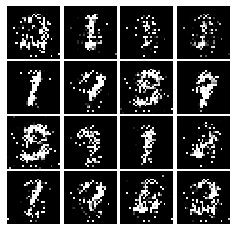

Epoch: 3, Iter: 1660, D: 0.09974, G:0.3354


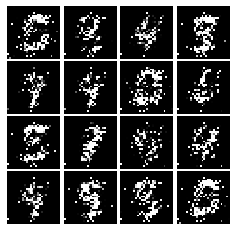

Epoch: 3, Iter: 1680, D: 0.1195, G:0.3284


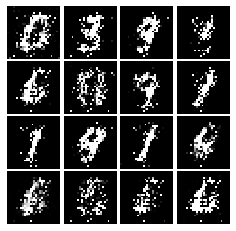

Epoch: 3, Iter: 1700, D: 0.1627, G:0.1171


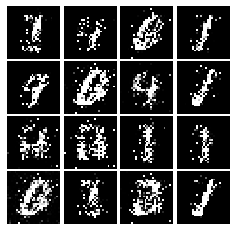

Epoch: 3, Iter: 1720, D: 0.1527, G:0.4793


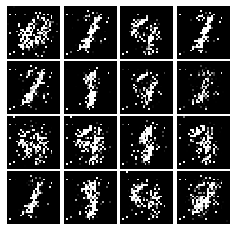

Epoch: 3, Iter: 1740, D: 0.1917, G:0.3718


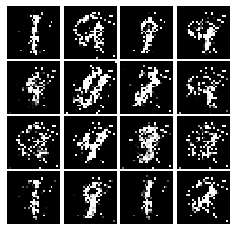

Epoch: 3, Iter: 1760, D: 0.1774, G:0.3044


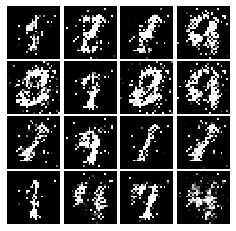

Epoch: 3, Iter: 1780, D: 0.2112, G:0.2521


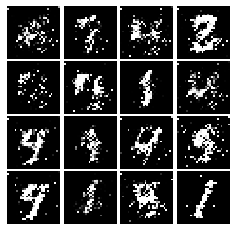

Epoch: 3, Iter: 1800, D: 0.1464, G:0.292


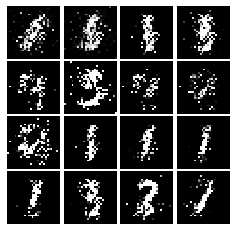

Epoch: 3, Iter: 1820, D: 0.1594, G:0.2596


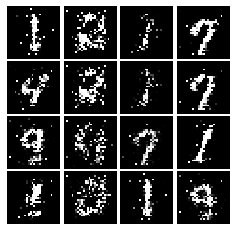

Epoch: 3, Iter: 1840, D: 0.1847, G:0.2342


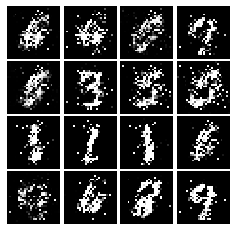

Epoch: 3, Iter: 1860, D: 0.1701, G:0.2472


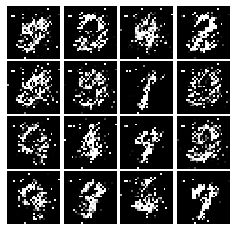

Epoch: 4, Iter: 1880, D: 0.1556, G:0.305


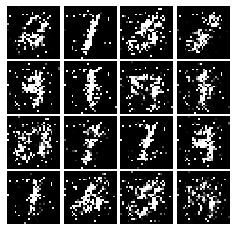

Epoch: 4, Iter: 1900, D: 0.3579, G:0.1933


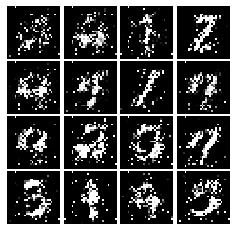

Epoch: 4, Iter: 1920, D: 0.1635, G:0.2288


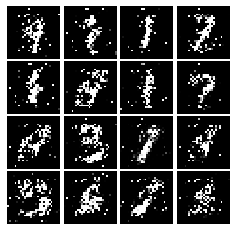

Epoch: 4, Iter: 1940, D: 0.182, G:0.2472


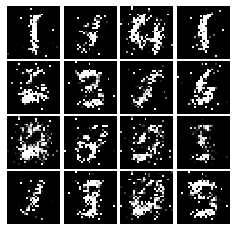

Epoch: 4, Iter: 1960, D: 0.1997, G:0.2336


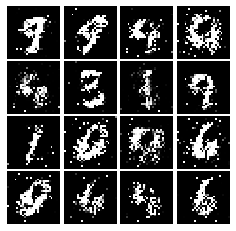

Epoch: 4, Iter: 1980, D: 0.1783, G:0.3568


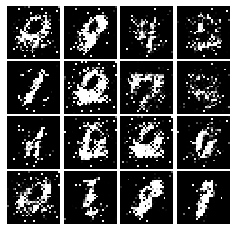

Epoch: 4, Iter: 2000, D: 0.2325, G:0.2149


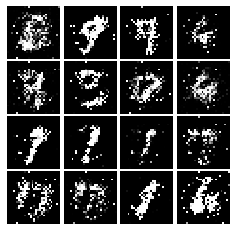

Epoch: 4, Iter: 2020, D: 0.1867, G:0.2352


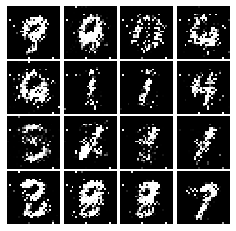

Epoch: 4, Iter: 2040, D: 0.2264, G:0.2176


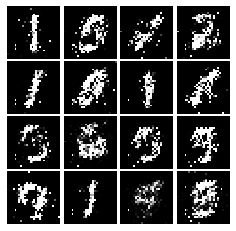

Epoch: 4, Iter: 2060, D: 0.2052, G:0.2032


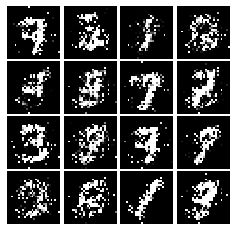

Epoch: 4, Iter: 2080, D: 0.1575, G:0.3003


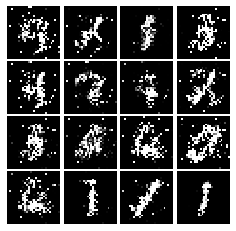

Epoch: 4, Iter: 2100, D: 0.1822, G:0.2588


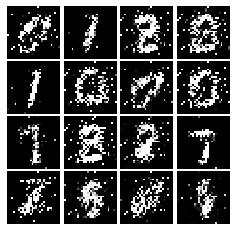

Epoch: 4, Iter: 2120, D: 0.1984, G:0.3565


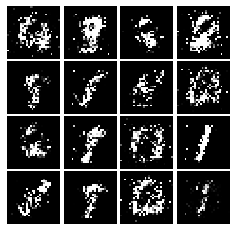

Epoch: 4, Iter: 2140, D: 0.2258, G:0.1693


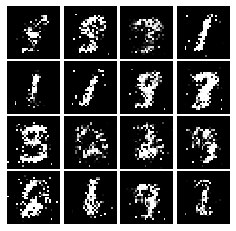

Epoch: 4, Iter: 2160, D: 0.2341, G:0.2069


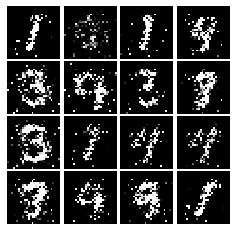

Epoch: 4, Iter: 2180, D: 0.2737, G:0.1217


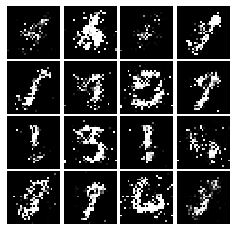

Epoch: 4, Iter: 2200, D: 0.2025, G:0.1913


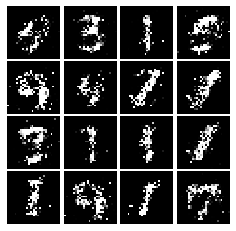

Epoch: 4, Iter: 2220, D: 0.2208, G:0.2018


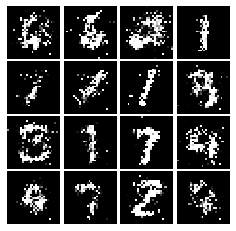

Epoch: 4, Iter: 2240, D: 0.1976, G:0.1797


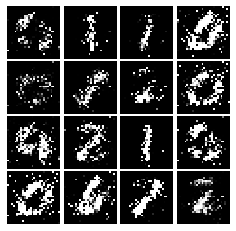

Epoch: 4, Iter: 2260, D: 0.2042, G:0.2663


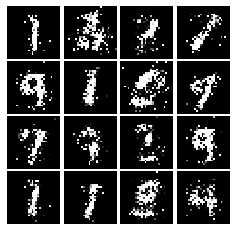

Epoch: 4, Iter: 2280, D: 0.182, G:0.2383


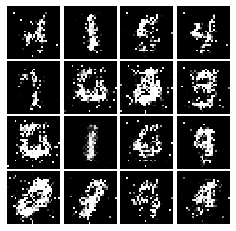

Epoch: 4, Iter: 2300, D: 0.317, G:0.1076


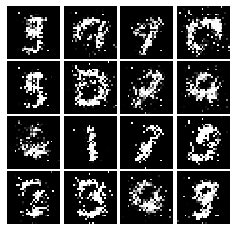

Epoch: 4, Iter: 2320, D: 0.1852, G:0.2772


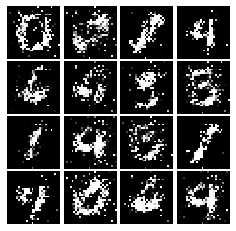

Epoch: 4, Iter: 2340, D: 0.1867, G:0.2273


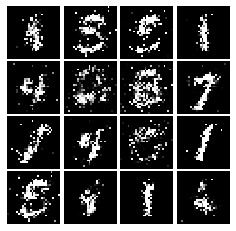

Epoch: 5, Iter: 2360, D: 0.1971, G:0.2233


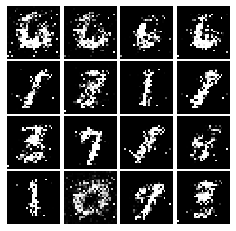

Epoch: 5, Iter: 2380, D: 0.1947, G:0.2085


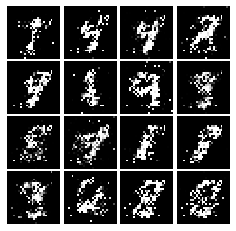

Epoch: 5, Iter: 2400, D: 0.2057, G:0.1944


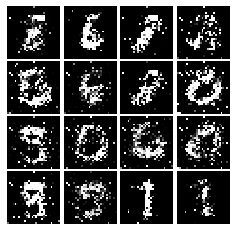

Epoch: 5, Iter: 2420, D: 0.228, G:0.1859


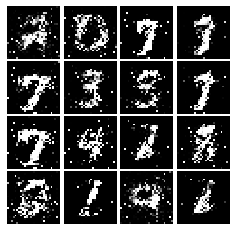

Epoch: 5, Iter: 2440, D: 0.2106, G:0.1848


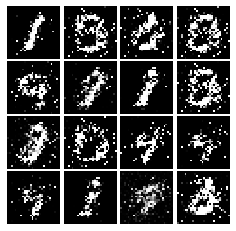

Epoch: 5, Iter: 2460, D: 0.205, G:0.2086


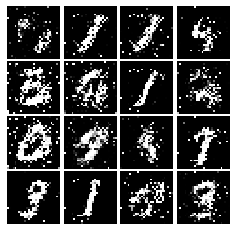

Epoch: 5, Iter: 2480, D: 0.1909, G:0.222


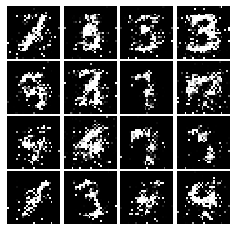

Epoch: 5, Iter: 2500, D: 0.1975, G:0.2164


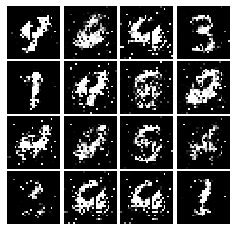

Epoch: 5, Iter: 2520, D: 0.2517, G:0.2315


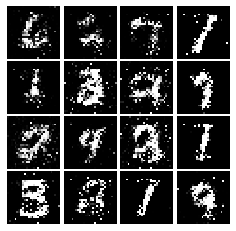

Epoch: 5, Iter: 2540, D: 0.2074, G:0.2975


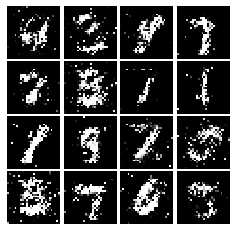

Epoch: 5, Iter: 2560, D: 0.1942, G:0.1677


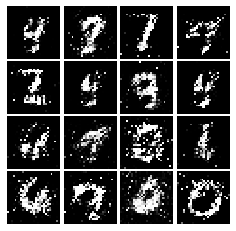

Epoch: 5, Iter: 2580, D: 0.2206, G:0.2152


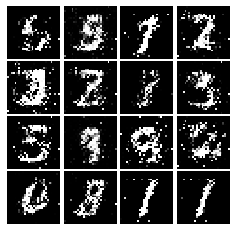

Epoch: 5, Iter: 2600, D: 0.2258, G:0.1565


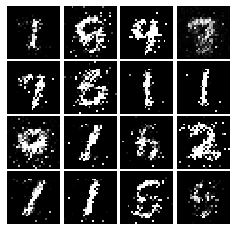

Epoch: 5, Iter: 2620, D: 0.2563, G:0.05251


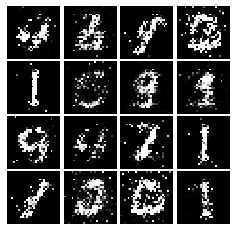

Epoch: 5, Iter: 2640, D: 0.2054, G:0.2107


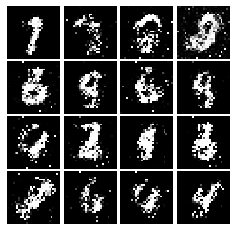

Epoch: 5, Iter: 2660, D: 0.2333, G:0.1774


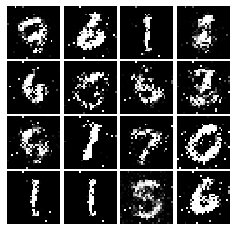

Epoch: 5, Iter: 2680, D: 0.2213, G:0.1209


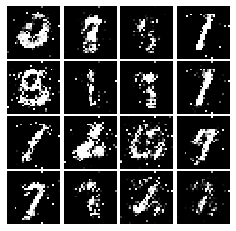

Epoch: 5, Iter: 2700, D: 0.2336, G:0.1537


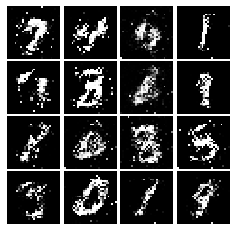

Epoch: 5, Iter: 2720, D: 0.1877, G:0.1894


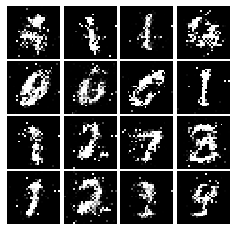

Epoch: 5, Iter: 2740, D: 0.2007, G:0.1994


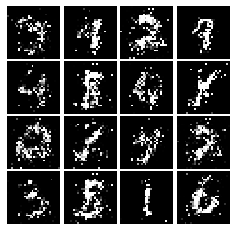

Epoch: 5, Iter: 2760, D: 0.2101, G:0.1767


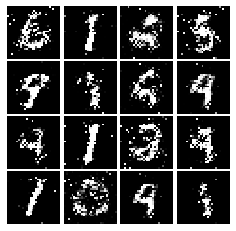

Epoch: 5, Iter: 2780, D: 0.1956, G:0.1823


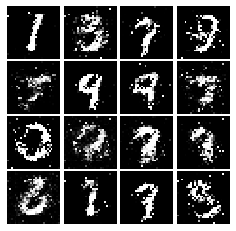

Epoch: 5, Iter: 2800, D: 0.22, G:0.1957


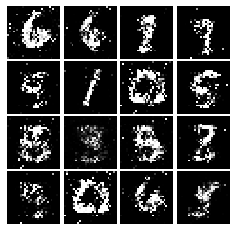

Epoch: 6, Iter: 2820, D: 0.2305, G:0.1976


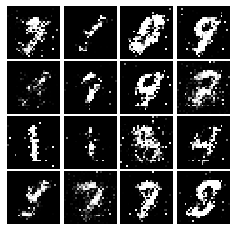

Epoch: 6, Iter: 2840, D: 0.2374, G:0.285


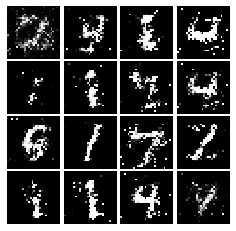

Epoch: 6, Iter: 2860, D: 0.2177, G:0.1717


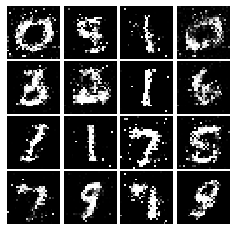

Epoch: 6, Iter: 2880, D: 0.1997, G:0.2774


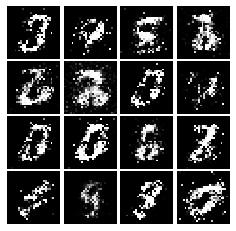

Epoch: 6, Iter: 2900, D: 0.2191, G:0.1684


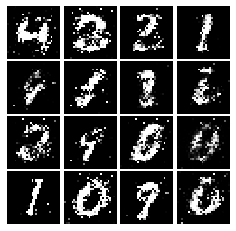

Epoch: 6, Iter: 2920, D: 0.2438, G:0.1857


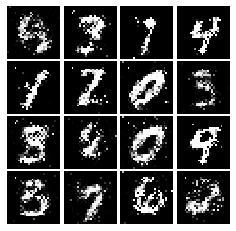

Epoch: 6, Iter: 2940, D: 0.2153, G:0.1834


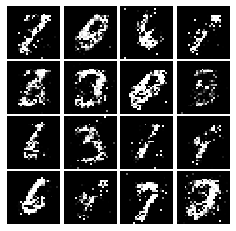

Epoch: 6, Iter: 2960, D: 0.2403, G:0.1668


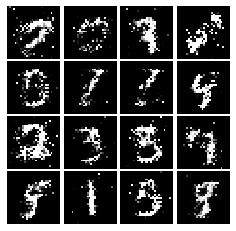

Epoch: 6, Iter: 2980, D: 0.2227, G:0.1716


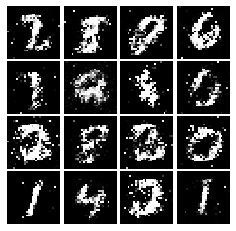

Epoch: 6, Iter: 3000, D: 0.2171, G:0.239


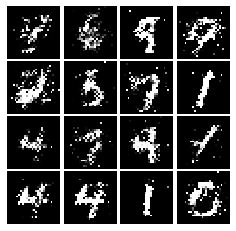

Epoch: 6, Iter: 3020, D: 0.2203, G:0.1707


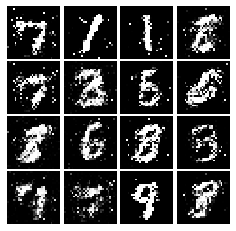

Epoch: 6, Iter: 3040, D: 0.239, G:0.1839


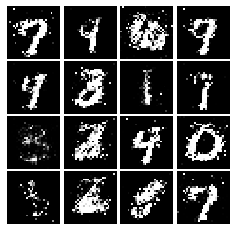

Epoch: 6, Iter: 3060, D: 0.2243, G:0.1972


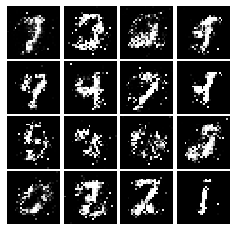

Epoch: 6, Iter: 3080, D: 0.2425, G:0.1944


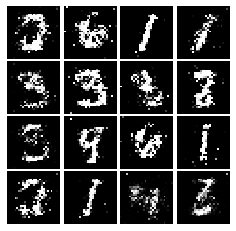

Epoch: 6, Iter: 3100, D: 0.1981, G:0.2046


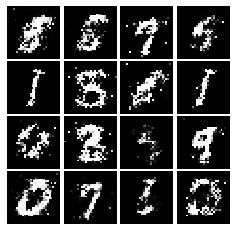

Epoch: 6, Iter: 3120, D: 0.2133, G:0.1687


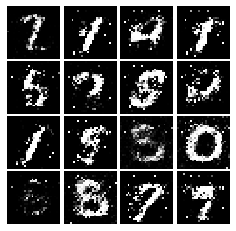

Epoch: 6, Iter: 3140, D: 0.2287, G:0.1553


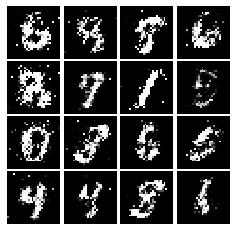

Epoch: 6, Iter: 3160, D: 0.2293, G:0.1846


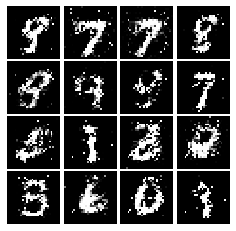

Epoch: 6, Iter: 3180, D: 0.2312, G:0.1896


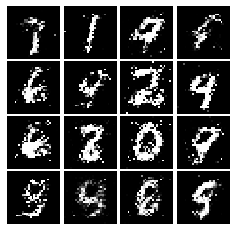

Epoch: 6, Iter: 3200, D: 0.243, G:0.1896


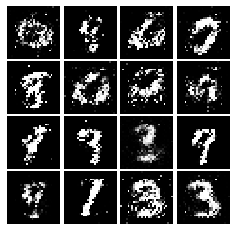

Epoch: 6, Iter: 3220, D: 0.2455, G:0.1916


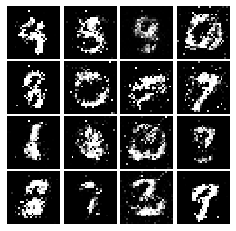

Epoch: 6, Iter: 3240, D: 0.2197, G:0.1845


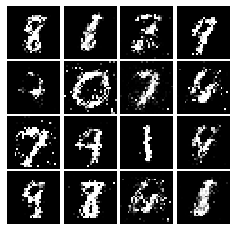

Epoch: 6, Iter: 3260, D: 0.2457, G:0.1369


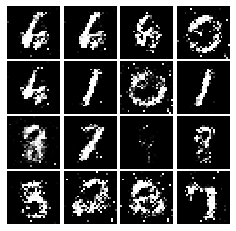

Epoch: 6, Iter: 3280, D: 0.2218, G:0.1556


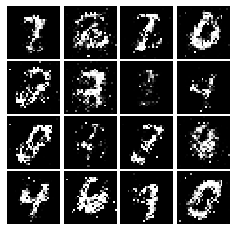

Epoch: 7, Iter: 3300, D: 0.198, G:0.1608


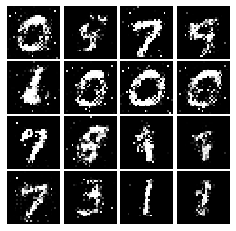

Epoch: 7, Iter: 3320, D: 0.2466, G:0.1583


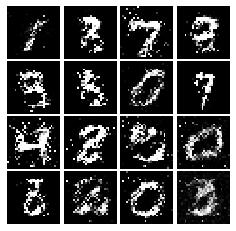

Epoch: 7, Iter: 3340, D: 0.2238, G:0.1724


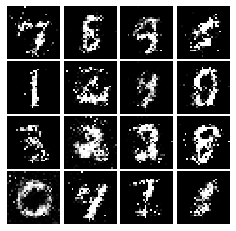

Epoch: 7, Iter: 3360, D: 0.2334, G:0.1688


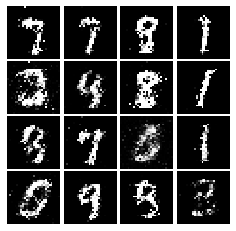

Epoch: 7, Iter: 3380, D: 0.2252, G:0.1749


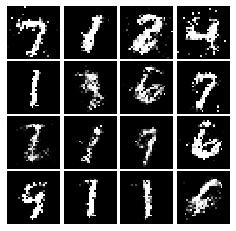

Epoch: 7, Iter: 3400, D: 0.2377, G:0.1327


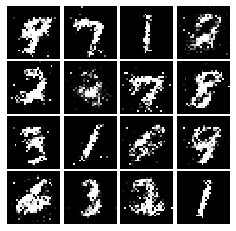

Epoch: 7, Iter: 3420, D: 0.242, G:0.1541


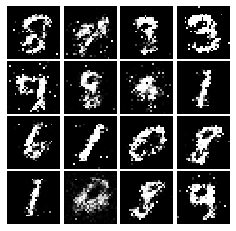

Epoch: 7, Iter: 3440, D: 0.236, G:0.1814


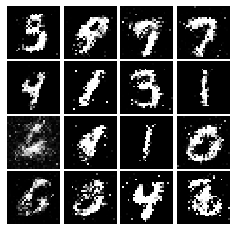

Epoch: 7, Iter: 3460, D: 0.2296, G:0.1623


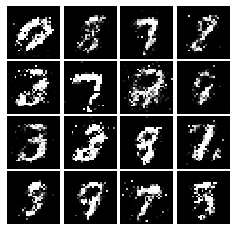

Epoch: 7, Iter: 3480, D: 0.2353, G:0.1622


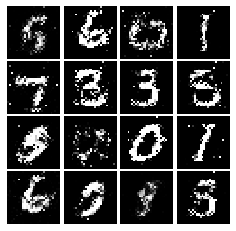

Epoch: 7, Iter: 3500, D: 0.2406, G:0.18


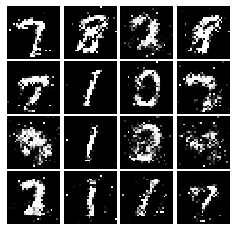

Epoch: 7, Iter: 3520, D: 0.2271, G:0.1492


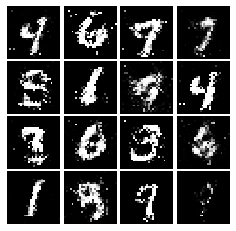

Epoch: 7, Iter: 3540, D: 0.2174, G:0.1513


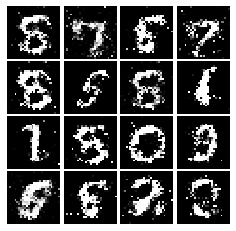

Epoch: 7, Iter: 3560, D: 0.2181, G:0.1719


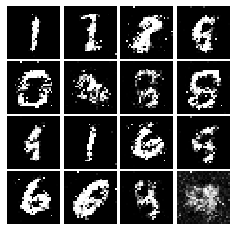

Epoch: 7, Iter: 3580, D: 0.2339, G:0.1629


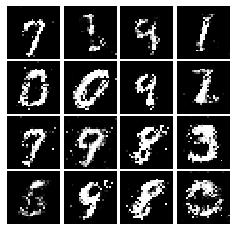

Epoch: 7, Iter: 3600, D: 0.2405, G:0.1361


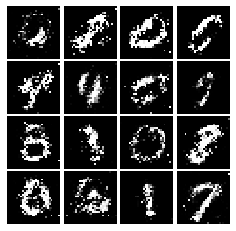

Epoch: 7, Iter: 3620, D: 0.219, G:0.1654


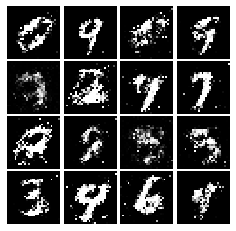

Epoch: 7, Iter: 3640, D: 0.2213, G:0.1775


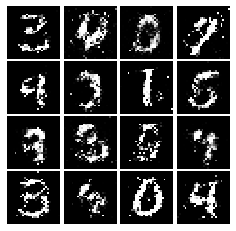

Epoch: 7, Iter: 3660, D: 0.2249, G:0.1683


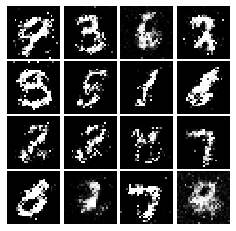

Epoch: 7, Iter: 3680, D: 0.2428, G:0.1609


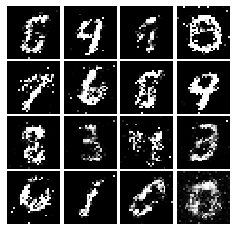

Epoch: 7, Iter: 3700, D: 0.2323, G:0.1664


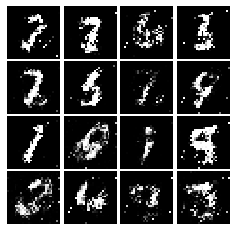

Epoch: 7, Iter: 3720, D: 0.2146, G:0.1852


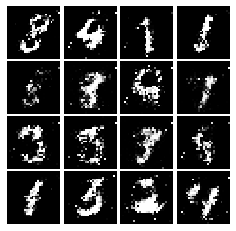

Epoch: 7, Iter: 3740, D: 0.2129, G:0.1697


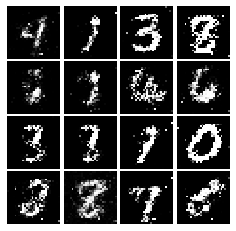

Epoch: 8, Iter: 3760, D: 0.2405, G:0.1517


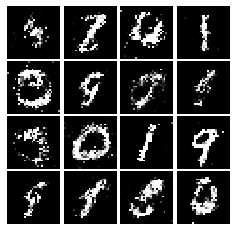

Epoch: 8, Iter: 3780, D: 0.2326, G:0.1694


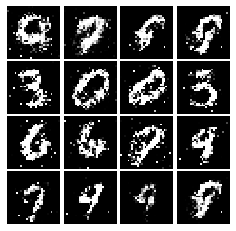

Epoch: 8, Iter: 3800, D: 0.2548, G:0.1653


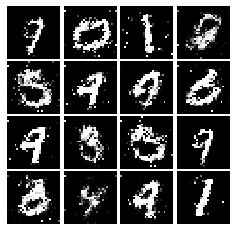

Epoch: 8, Iter: 3820, D: 0.22, G:0.1784


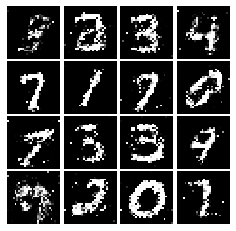

Epoch: 8, Iter: 3840, D: 0.2394, G:0.1609


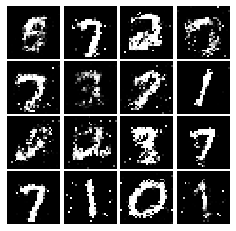

Epoch: 8, Iter: 3860, D: 0.2182, G:0.1894


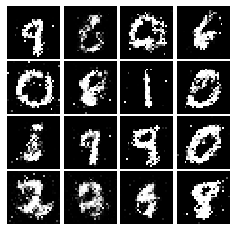

Epoch: 8, Iter: 3880, D: 0.2399, G:0.1742


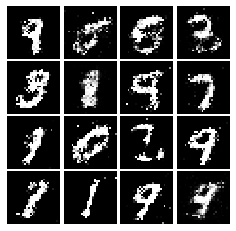

Epoch: 8, Iter: 3900, D: 0.2247, G:0.1774


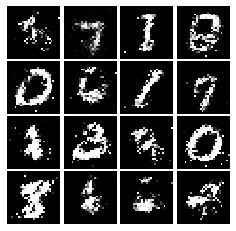

Epoch: 8, Iter: 3920, D: 0.2074, G:0.1661


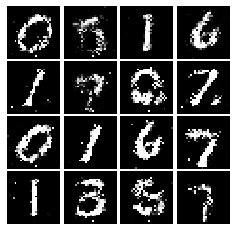

Epoch: 8, Iter: 3940, D: 0.2323, G:0.1658


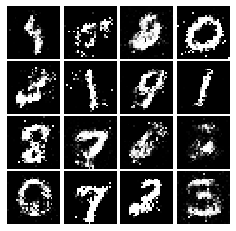

Epoch: 8, Iter: 3960, D: 0.2501, G:0.1579


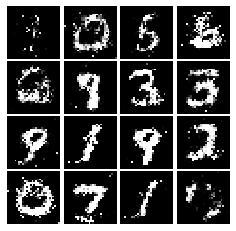

Epoch: 8, Iter: 3980, D: 0.2263, G:0.1545


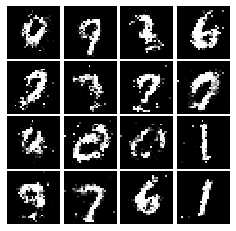

Epoch: 8, Iter: 4000, D: 0.2178, G:0.1534


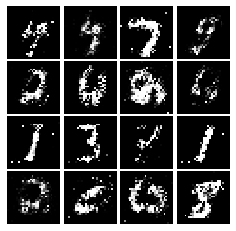

Epoch: 8, Iter: 4020, D: 0.2371, G:0.1488


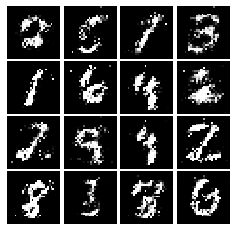

Epoch: 8, Iter: 4040, D: 0.241, G:0.1599


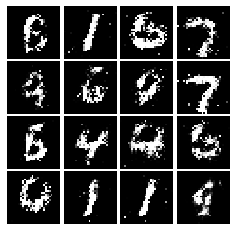

Epoch: 8, Iter: 4060, D: 0.2368, G:0.1548


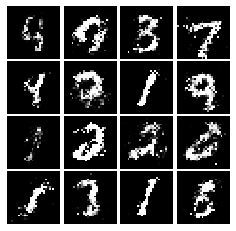

Epoch: 8, Iter: 4080, D: 0.243, G:0.1497


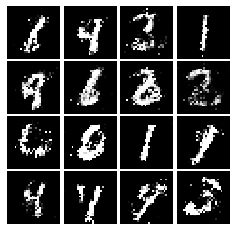

Epoch: 8, Iter: 4100, D: 0.2351, G:0.1457


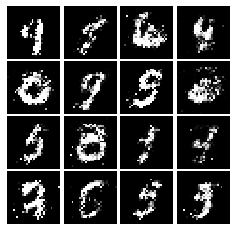

Epoch: 8, Iter: 4120, D: 0.2281, G:0.162


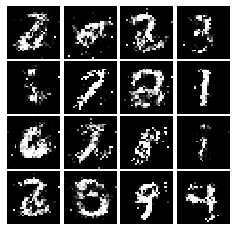

Epoch: 8, Iter: 4140, D: 0.2284, G:0.1623


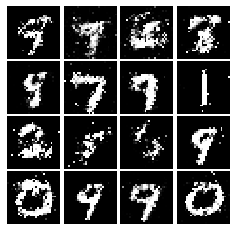

Epoch: 8, Iter: 4160, D: 0.2407, G:0.1649


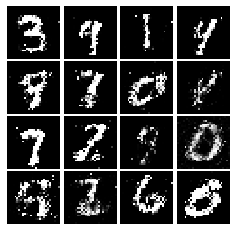

Epoch: 8, Iter: 4180, D: 0.2378, G:0.1906


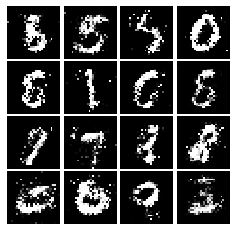

Epoch: 8, Iter: 4200, D: 0.2313, G:0.156


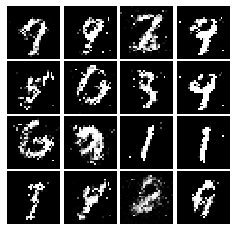

Epoch: 8, Iter: 4220, D: 0.2261, G:0.1719


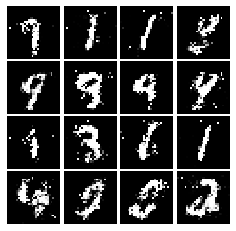

Epoch: 9, Iter: 4240, D: 0.256, G:0.1495


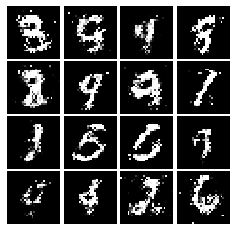

Epoch: 9, Iter: 4260, D: 0.2574, G:0.1592


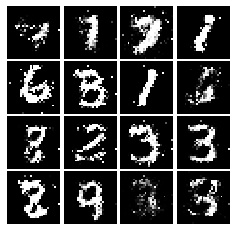

Epoch: 9, Iter: 4280, D: 0.252, G:0.1746


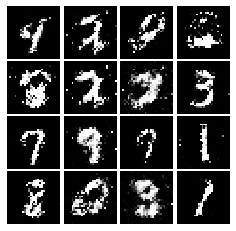

Epoch: 9, Iter: 4300, D: 0.2532, G:0.1665


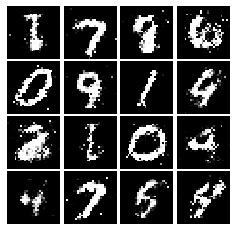

Epoch: 9, Iter: 4320, D: 0.2373, G:0.1771


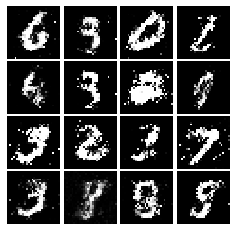

Epoch: 9, Iter: 4340, D: 0.233, G:0.15


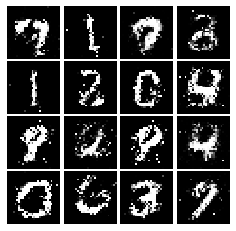

Epoch: 9, Iter: 4360, D: 0.2408, G:0.1624


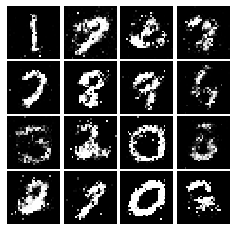

Epoch: 9, Iter: 4380, D: 0.2475, G:0.1765


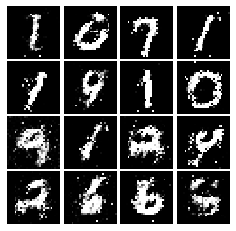

Epoch: 9, Iter: 4400, D: 0.2112, G:0.1791


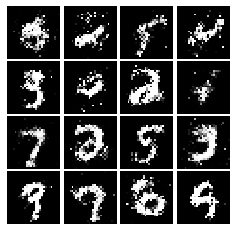

Epoch: 9, Iter: 4420, D: 0.2316, G:0.1454


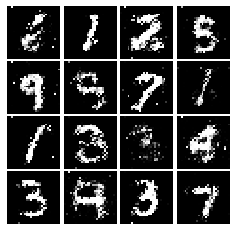

Epoch: 9, Iter: 4440, D: 0.2329, G:0.1366


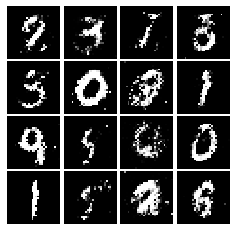

Epoch: 9, Iter: 4460, D: 0.231, G:0.1418


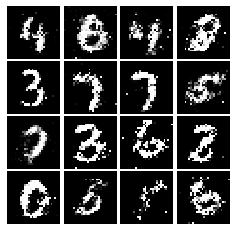

Epoch: 9, Iter: 4480, D: 0.221, G:0.182


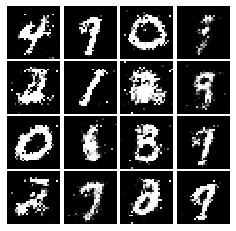

Epoch: 9, Iter: 4500, D: 0.2694, G:0.1625


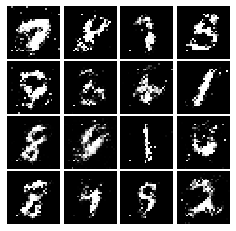

Epoch: 9, Iter: 4520, D: 0.2422, G:0.1857


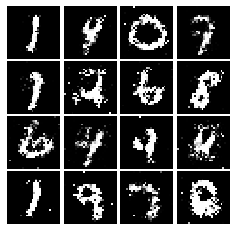

Epoch: 9, Iter: 4540, D: 0.2265, G:0.1583


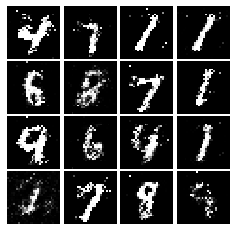

Epoch: 9, Iter: 4560, D: 0.2321, G:0.1651


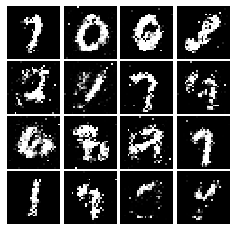

Epoch: 9, Iter: 4580, D: 0.2344, G:0.1468


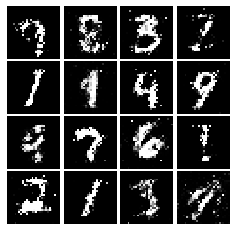

Epoch: 9, Iter: 4600, D: 0.2346, G:0.1547


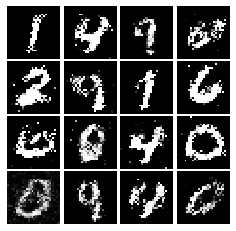

Epoch: 9, Iter: 4620, D: 0.2279, G:0.1665


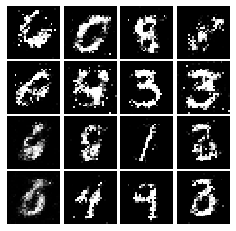

Epoch: 9, Iter: 4640, D: 0.2265, G:0.1573


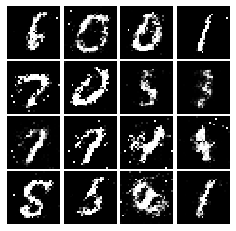

Epoch: 9, Iter: 4660, D: 0.2336, G:0.158


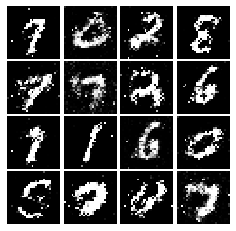

Epoch: 9, Iter: 4680, D: 0.2583, G:0.1608


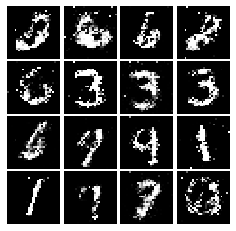

Final images


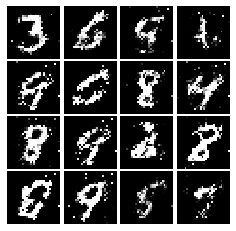

In [62]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [77]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784, )),
        tf.keras.layers.Conv2D(32, (5, 5), activation = leaky_relu), 
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
        tf.keras.layers.Conv2D(64, (5, 5), activation = leaky_relu), 
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, activation = leaky_relu),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [78]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(1024, input_shape=(noise_dim, ), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7 * 7 * 128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(64, 4, strides=2, activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, 4, strides=2, activation='tanh', padding='same')
    ])
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.517, G:0.6521


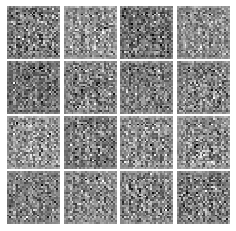

Epoch: 0, Iter: 20, D: 0.4759, G:1.221


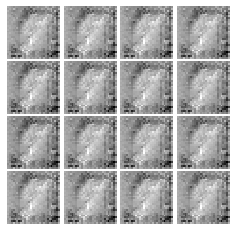

Epoch: 0, Iter: 40, D: 0.1524, G:2.497


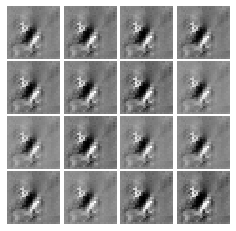

Epoch: 0, Iter: 60, D: 0.8318, G:1.993


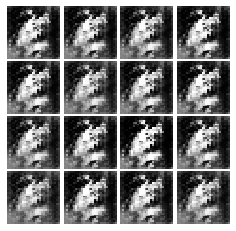

Epoch: 0, Iter: 80, D: 0.2571, G:2.378


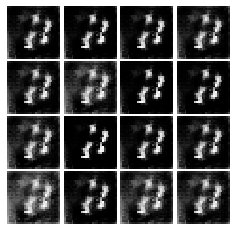

Epoch: 0, Iter: 100, D: 0.8542, G:4.557


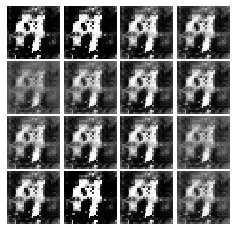

Epoch: 0, Iter: 120, D: 0.3941, G:2.335


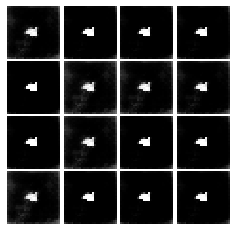

Epoch: 0, Iter: 140, D: 0.06482, G:4.707


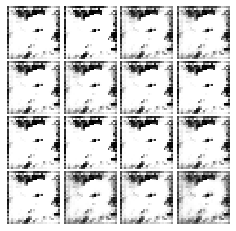

Epoch: 0, Iter: 160, D: 3.697, G:3.194


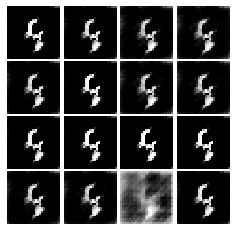

Epoch: 0, Iter: 180, D: 0.4898, G:2.753


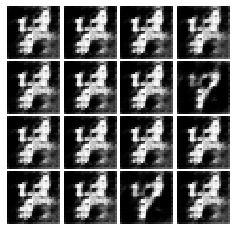

Epoch: 0, Iter: 200, D: 0.5281, G:2.872


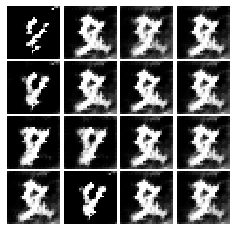

Epoch: 0, Iter: 220, D: 0.1976, G:3.442


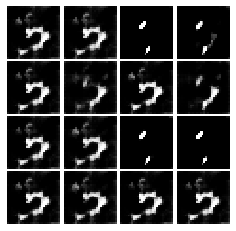

Epoch: 0, Iter: 240, D: 1.745, G:16.09


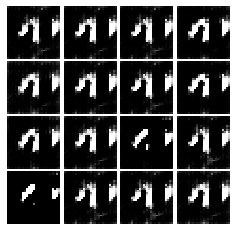

Epoch: 0, Iter: 260, D: 0.1832, G:3.987


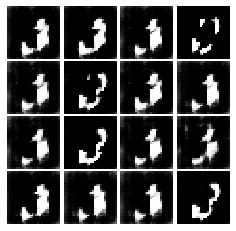

Epoch: 0, Iter: 280, D: 0.4516, G:2.252


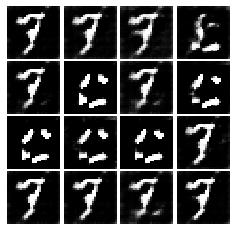

Epoch: 0, Iter: 300, D: 0.4698, G:2.737


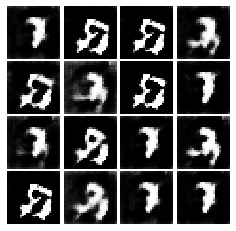

Epoch: 0, Iter: 320, D: 0.3594, G:3.734


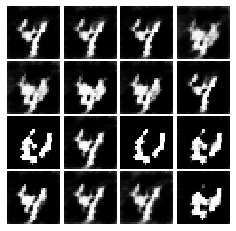

Epoch: 0, Iter: 340, D: 0.2317, G:2.843


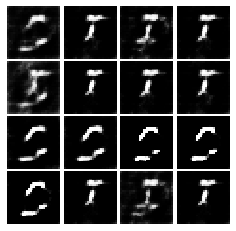

Epoch: 0, Iter: 360, D: 0.3924, G:3.628


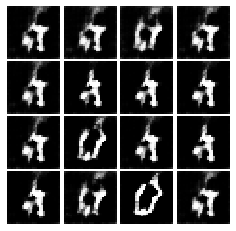

Epoch: 0, Iter: 380, D: 0.2817, G:3.939


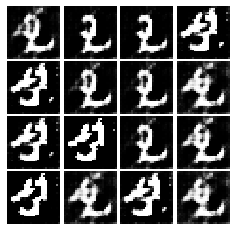

Epoch: 0, Iter: 400, D: 0.2814, G:3.285


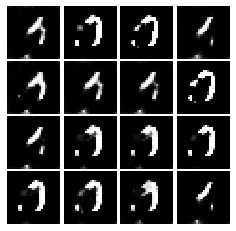

Epoch: 0, Iter: 420, D: 1.05, G:3.996


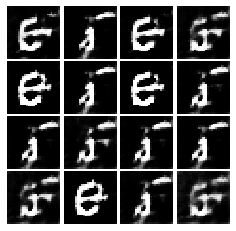

Epoch: 0, Iter: 440, D: 1.229, G:1.441


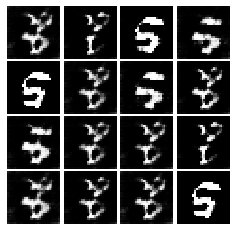

Epoch: 0, Iter: 460, D: 0.377, G:4.884


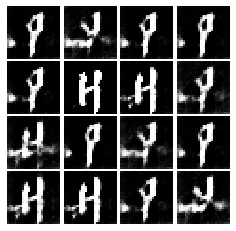

Epoch: 1, Iter: 480, D: 0.5229, G:3.406


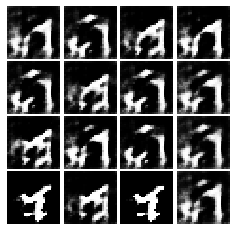

Epoch: 1, Iter: 500, D: 0.3691, G:2.514


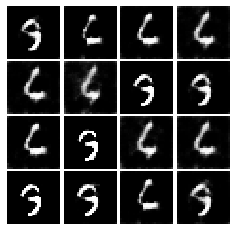

Epoch: 1, Iter: 520, D: 0.3064, G:2.247


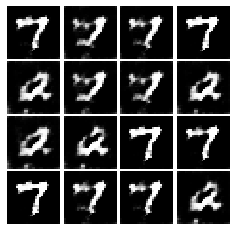

Epoch: 1, Iter: 540, D: 0.3511, G:3.757


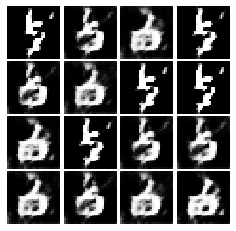

Epoch: 1, Iter: 560, D: 0.2953, G:4.464


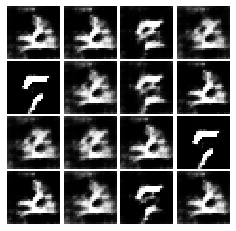

Epoch: 1, Iter: 580, D: 0.5079, G:2.687


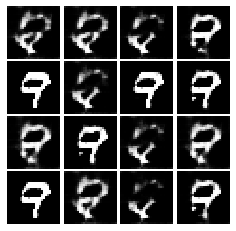

Epoch: 1, Iter: 600, D: 0.3945, G:2.058


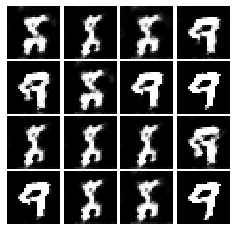

Epoch: 1, Iter: 620, D: 0.3321, G:3.122


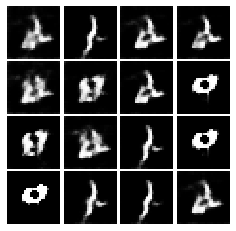

Epoch: 1, Iter: 640, D: 0.4467, G:3.761


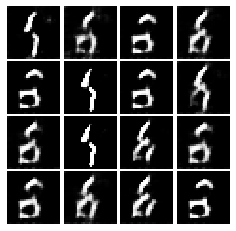

Epoch: 1, Iter: 660, D: 0.2463, G:3.013


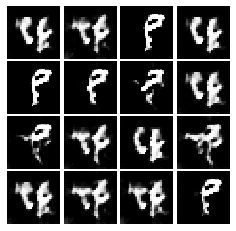

Epoch: 1, Iter: 680, D: 0.5285, G:3.119


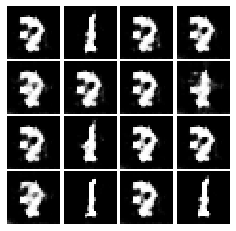

Epoch: 1, Iter: 700, D: 0.5314, G:3.606


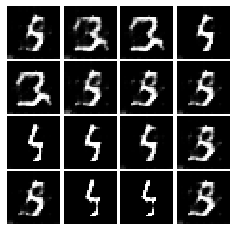

Epoch: 1, Iter: 720, D: 0.08888, G:2.924


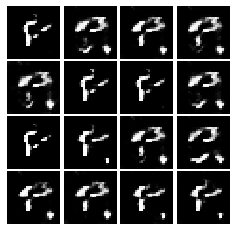

Epoch: 1, Iter: 740, D: 0.2567, G:3.434


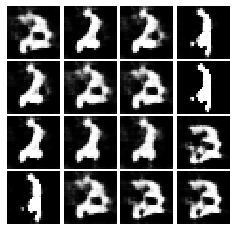

Epoch: 1, Iter: 760, D: 0.7175, G:4.322


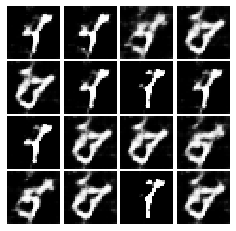

Epoch: 1, Iter: 780, D: 0.6204, G:5.137


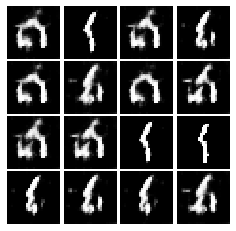

Epoch: 1, Iter: 800, D: 0.3611, G:2.599


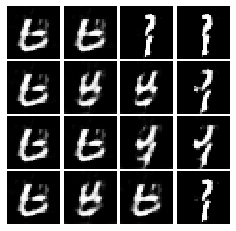

Epoch: 1, Iter: 820, D: 1.207, G:1.258


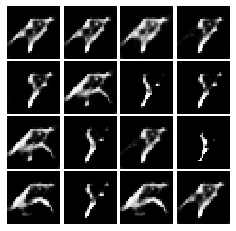

Epoch: 1, Iter: 840, D: 0.4522, G:5.797


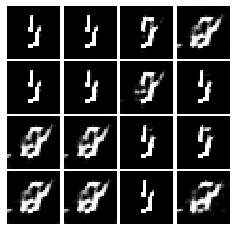

Epoch: 1, Iter: 860, D: 0.3798, G:4.437


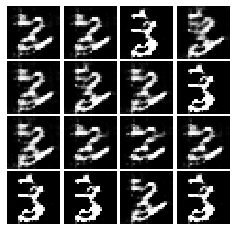

Epoch: 1, Iter: 880, D: 0.454, G:1.847


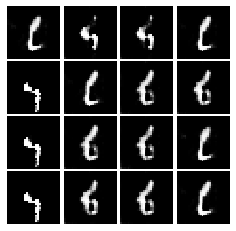

Epoch: 1, Iter: 900, D: 0.3167, G:4.509


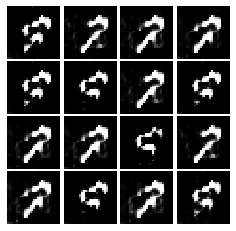

Epoch: 1, Iter: 920, D: 0.2228, G:3.737


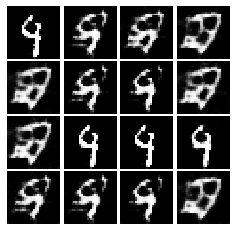

Epoch: 2, Iter: 940, D: 0.4219, G:3.379


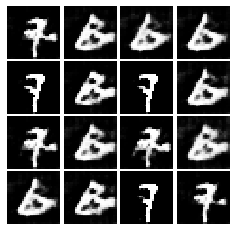

Epoch: 2, Iter: 960, D: 0.4295, G:3.517


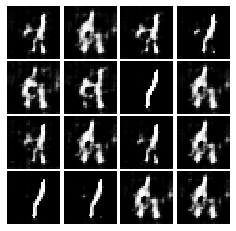

Epoch: 2, Iter: 980, D: 0.4638, G:4.4


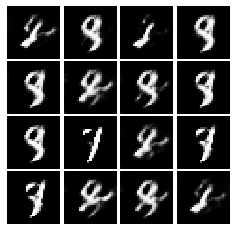

Epoch: 2, Iter: 1000, D: 0.4463, G:2.602


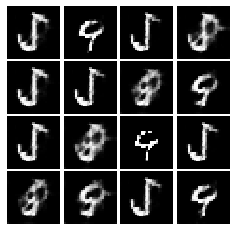

Epoch: 2, Iter: 1020, D: 0.2072, G:4.578


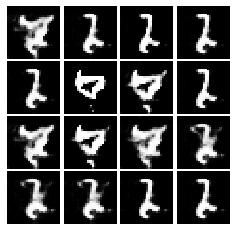

Epoch: 2, Iter: 1040, D: 0.2655, G:3.146


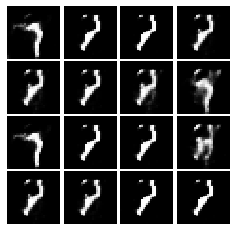

Epoch: 2, Iter: 1060, D: 0.5114, G:2.724


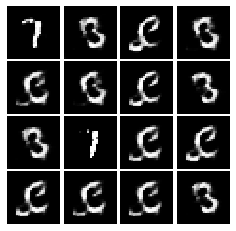

Epoch: 2, Iter: 1080, D: 0.1493, G:3.45


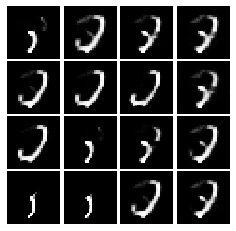

Epoch: 2, Iter: 1100, D: 1.608, G:2.727


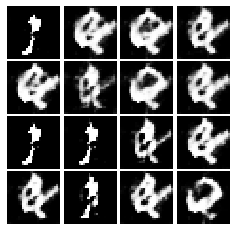

Epoch: 2, Iter: 1120, D: 0.5161, G:3.219


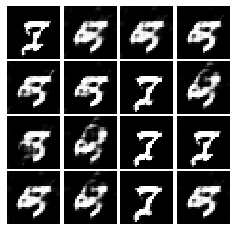

Epoch: 2, Iter: 1140, D: 0.7895, G:9.609


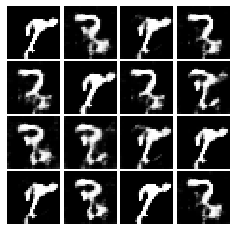

Epoch: 2, Iter: 1160, D: 0.3801, G:5.27


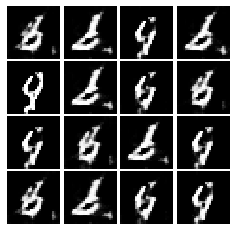

Epoch: 2, Iter: 1180, D: 0.2676, G:3.176


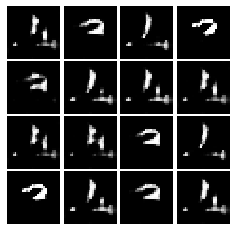

Epoch: 2, Iter: 1200, D: 0.07459, G:5.114


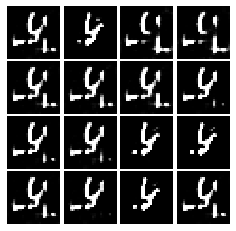

Epoch: 2, Iter: 1220, D: 0.9903, G:1.227


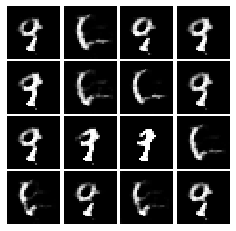

Epoch: 2, Iter: 1240, D: 0.2682, G:3.495


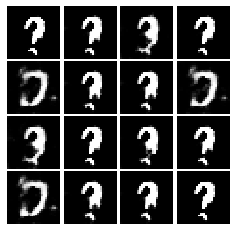

Epoch: 2, Iter: 1260, D: 0.2237, G:5.617


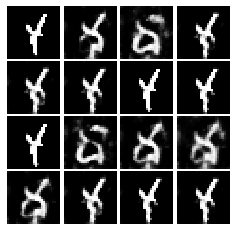

Epoch: 2, Iter: 1280, D: 0.3181, G:3.811


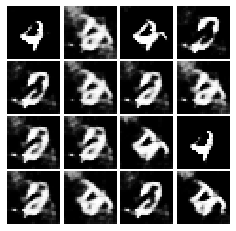

Epoch: 2, Iter: 1300, D: 0.3565, G:3.469


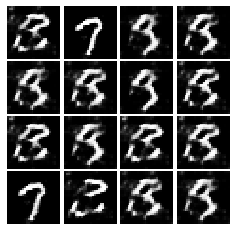

Epoch: 2, Iter: 1320, D: 0.3232, G:3.106


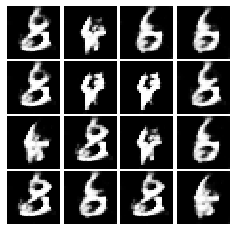

Epoch: 2, Iter: 1340, D: 0.2176, G:3.648


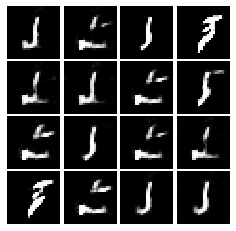

Epoch: 2, Iter: 1360, D: 0.1679, G:3.49


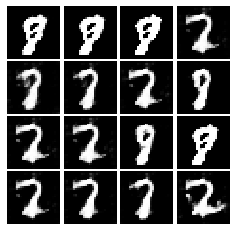

Epoch: 2, Iter: 1380, D: 0.3424, G:4.148


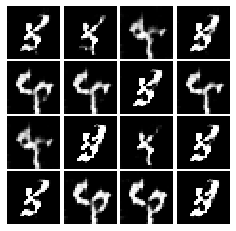

Epoch: 2, Iter: 1400, D: 0.2081, G:7.792


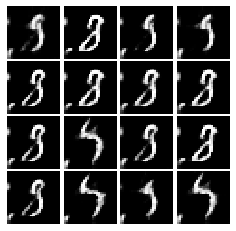

Epoch: 3, Iter: 1420, D: 0.3132, G:4.199


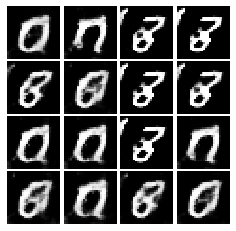

Epoch: 3, Iter: 1440, D: 0.4895, G:3.055


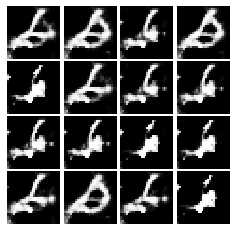

Epoch: 3, Iter: 1460, D: 0.3419, G:3.119


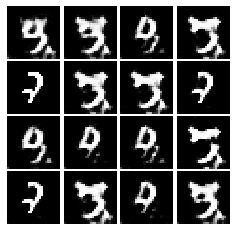

Epoch: 3, Iter: 1480, D: 0.2922, G:5.259


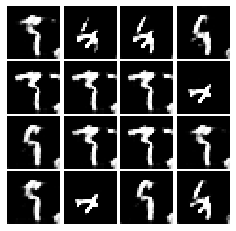

Epoch: 3, Iter: 1500, D: 0.2724, G:3.468


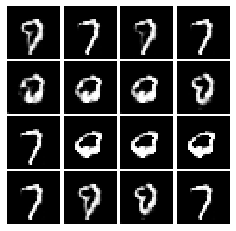

Epoch: 3, Iter: 1520, D: 0.229, G:3.391


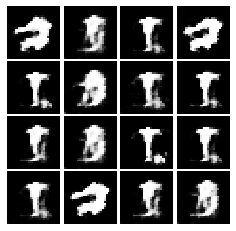

Epoch: 3, Iter: 1540, D: 0.179, G:4.735


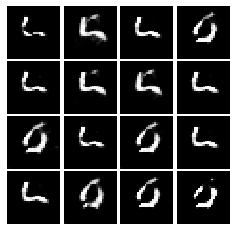

Epoch: 3, Iter: 1560, D: 0.1308, G:4.23


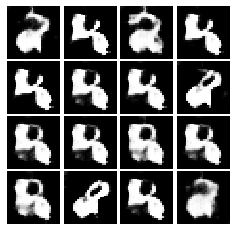

Epoch: 3, Iter: 1580, D: 0.207, G:3.572


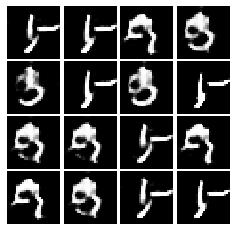

Epoch: 3, Iter: 1600, D: 0.9396, G:2.966


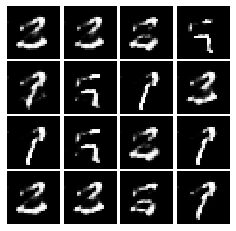

Epoch: 3, Iter: 1620, D: 0.1722, G:4.231


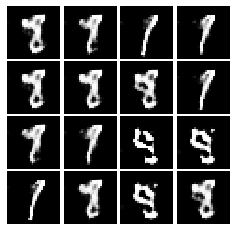

Epoch: 3, Iter: 1640, D: 0.1254, G:4.818


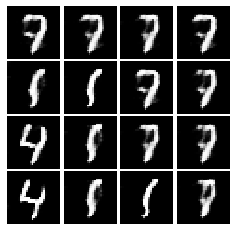

Epoch: 3, Iter: 1660, D: 0.4253, G:2.676


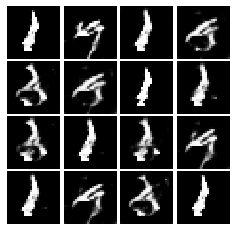

Epoch: 3, Iter: 1680, D: 0.736, G:3.9


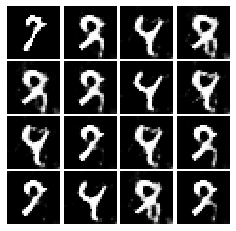

Epoch: 3, Iter: 1700, D: 0.1389, G:5.159


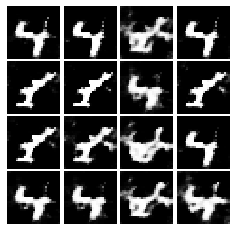

Epoch: 3, Iter: 1720, D: 1.134, G:4.356


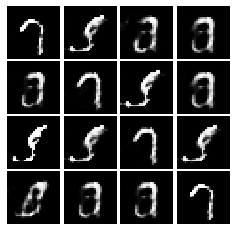

Epoch: 3, Iter: 1740, D: 0.3812, G:2.876


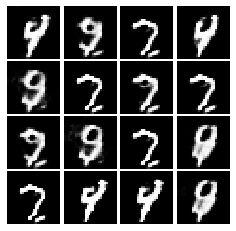

Epoch: 3, Iter: 1760, D: 0.3546, G:3.797


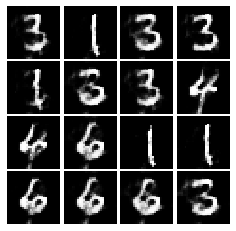

Epoch: 3, Iter: 1780, D: 0.2586, G:3.977


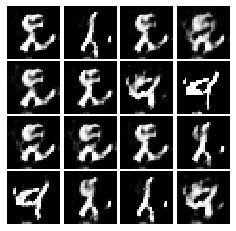

Epoch: 3, Iter: 1800, D: 0.7365, G:2.299


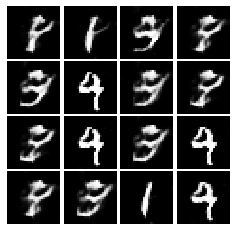

Epoch: 3, Iter: 1820, D: 0.6846, G:3.136


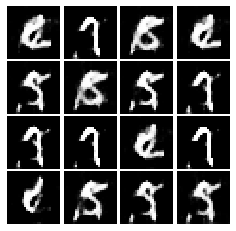

Epoch: 3, Iter: 1840, D: 0.4863, G:5.709


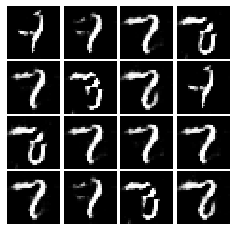

Epoch: 3, Iter: 1860, D: 0.2812, G:2.984


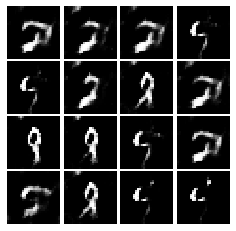

Epoch: 4, Iter: 1880, D: 0.2078, G:3.36


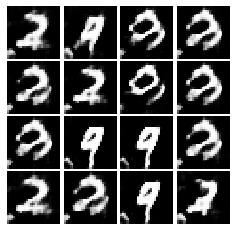

Epoch: 4, Iter: 1900, D: 0.2877, G:3.74


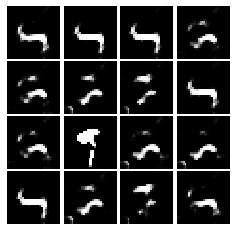

Epoch: 4, Iter: 1920, D: 0.993, G:10.08


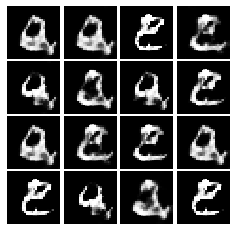

Epoch: 4, Iter: 1940, D: 0.6311, G:3.655


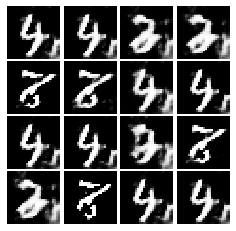

Epoch: 4, Iter: 1960, D: 0.1966, G:3.885


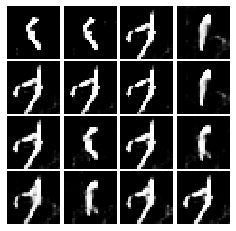

Epoch: 4, Iter: 1980, D: 0.09889, G:4.305


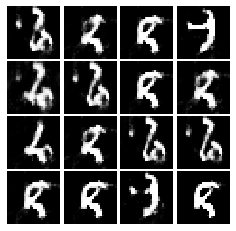

Epoch: 4, Iter: 2000, D: 0.3614, G:2.966


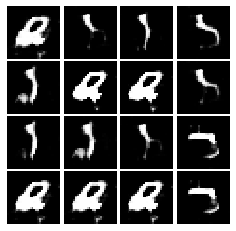

Epoch: 4, Iter: 2020, D: 0.7889, G:9.933


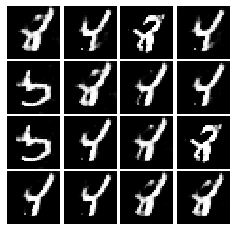

Epoch: 4, Iter: 2040, D: 0.7307, G:2.474


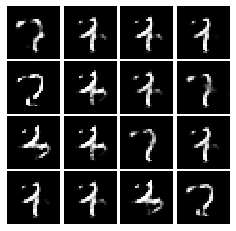

Epoch: 4, Iter: 2060, D: 0.3816, G:3.226


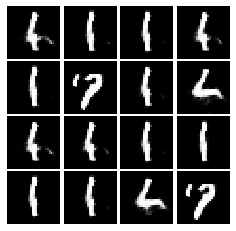

Epoch: 4, Iter: 2080, D: 0.8383, G:3.419


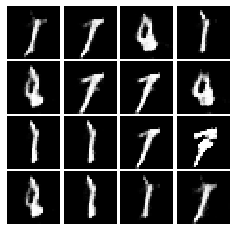

Epoch: 4, Iter: 2100, D: 0.3011, G:3.996


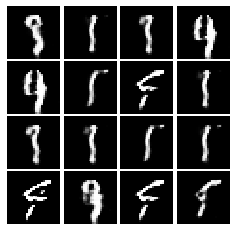

Epoch: 4, Iter: 2120, D: 0.2402, G:3.187


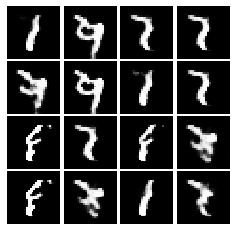

Epoch: 4, Iter: 2140, D: 0.3603, G:3.26


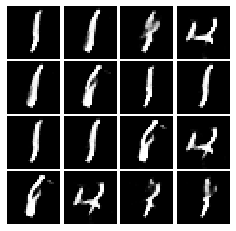

Epoch: 4, Iter: 2160, D: 0.1808, G:3.808


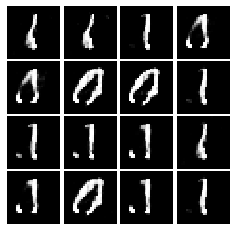

Epoch: 4, Iter: 2180, D: 0.2992, G:4.818


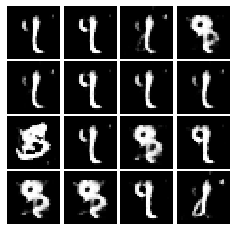

Epoch: 4, Iter: 2200, D: 0.4867, G:2.989


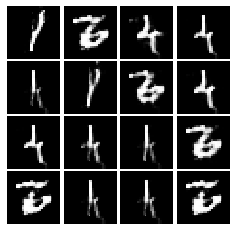

Epoch: 4, Iter: 2220, D: 0.2059, G:3.207


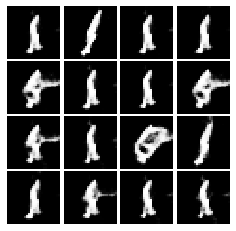

Epoch: 4, Iter: 2240, D: 0.4411, G:3.121


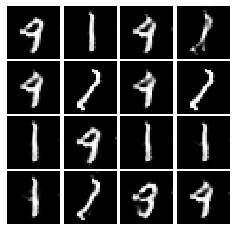

Epoch: 4, Iter: 2260, D: 0.2315, G:3.161


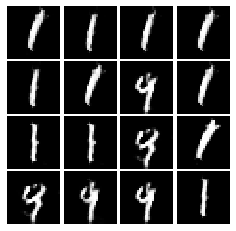

Epoch: 4, Iter: 2280, D: 0.2912, G:3.127


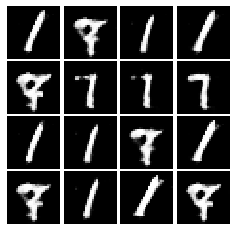

Epoch: 4, Iter: 2300, D: 0.4705, G:3.036


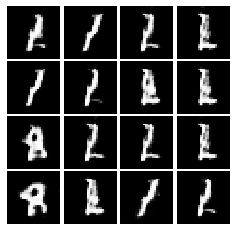

Epoch: 4, Iter: 2320, D: 0.2553, G:3.446


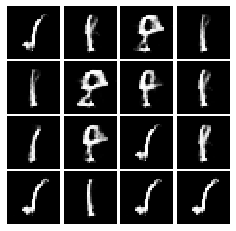

Epoch: 4, Iter: 2340, D: 0.3421, G:3.052


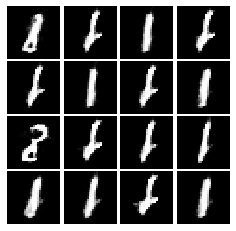

Final images


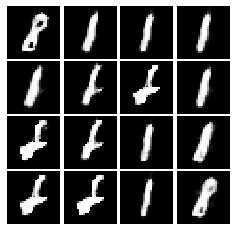

In [79]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
